## Py-imp is the section of the project that is implemented using Python
This notebook is the Explainable Machine Learning section for deep learning models

In [1]:
# Warning options (before all imports)
import warnings
warnings.filterwarnings('ignore')
# warnings.simplefilter(action='ignore', category=UserWarning)
# warnings.simplefilter(action='ignore', category=FutureWarning)
%xmode Verbose # simplified traceback when an exception occurs
# %xmode Plain

### Install needed packages


In [2]:
# Install a conda package in the current Jupyter kernel
import sys
# !mamba install -c conda-forge --yes --prefix {sys.prefix} <pkg>
# !conda install -c conda-forge --yes --prefix {sys.prefix} <pkg>

# Install a pip package in the current Jupyter kernel
# import sys
# !{sys.executable} - m pip install <pkg>

In [3]:
# 'sklearn for Time series data'
# !mamba install -c conda-forge --yes --prefix {sys.prefix} sktime-all-extras
# 'for Time series data'
# !mamba install -c conda-forge --yes --prefix {sys.prefix} feature_engine
# !mamba install -c conda-forge --yes --prefix {sys.prefix} mlxtend
# !mamba install -c conda-forge --yes --prefix {sys.prefix} statsmodels
# !mamba install -c conda-forge --yes --prefix {sys.prefix} ptitprince
# for XAI data dimension
# !mamba install -c conda-forge --yes --prefix {sys.prefix} deepchecks
# for XAI feature attribution
# !mamba install -c conda-forge --yes --prefix {sys.prefix} shap
# for XAI counterfactuals
# !mamba install -c conda-forge --yes --prefix {sys.prefix} dice-ml
# for XAI many
# !mamba install -c conda-forge --yes --prefix {sys.prefix} alibi

# for tf.keras.utils.plot_model
# !mamba install -c conda-forge --yes --prefix {sys.prefix} graphviz python-graphviz

# # upgrade pip
# !{sys.executable} -m pip install --upgrade pip

# # Debug pip
# # Uninstall SetupTools:
# !{sys.executable} -m pip uninstall pip setuptools
# # Reinstall Setuptools:
# !{sys.executable} -m pip install --upgrade setuptools

# feature engineering Time series data
# !{sys.executable} -m pip install tsfresh
# pretty Matplotlib plots
# !{sys.executable} -m pip install git+https://github.com/iammelvink/LovelyPlots
# better progress bar
# !{sys.executable} -m pip install rich
# better 'describe'
# !{sys.executable} -m pip install skimpy
# For size encoded heatmaps
# !{sys.executable} -m pip install heatmapz
# XGBoost
# !{sys.executable} -m pip install xgboost
# !{sys.executable} -m pip install lightgbm
# !{sys.executable} -m pip install catboost
# !{sys.executable} -m pip install fastprogress
# !{sys.executable} -m pip install matplotx[all]
# !{sys.executable} -m pip install matplotx
# !{sys.executable} -m pip install lux
# !jupyter nbextension install --py luxwidget
# !jupyter nbextension enable --py luxwidget

# !{sys.executable} -m pip install sweetviz
# !{sys.executable} -m pip install yellowbrick
# !{sys.executable} -m pip install autoviz
# !{sys.executable} -m pip install pandas-profiling
# !{sys.executable} -m pip install dtale
# !{sys.executable} -m pip install sketch
# !{sys.executable} -m pip install watermark
# !{sys.executable} -m pip install snoop
# for tf.keras.utils.plot_model
# !{sys.executable} -m pip install pydot
# for optimising hyperparameters
# !{sys.executable} -m pip install optuna
# to save models to files
# !{sys.executable} -m pip install joblib
# for creating visualisations of model architectures
# !{sys.executable} -m pip install git+https://github.com/paulgavrikov/visualkeras
# !{sys.executable} -m pip install git+https://github.com/RedaOps/ann-visualizer
# !{sys.executable} -m pip install visualkeras

# for feature selection
# !{sys.executable} -m pip install Boruta
# for feature selection BorutaShap
# !{sys.executable} -m pip install git+https://github.com/Ekeany/Boruta-Shap
# for feature selection using SHAP
# !{sys.executable} -m pip install shap-hypetune
# to export .ipynb to .pdf
# !{sys.executable} -m pip install nbconvert
# !{sys.executable} -m pip install adjustText
# to save models to files
# !mamba install -c conda-forge --yes --prefix {sys.prefix} h5py==3.9.0 --force-reinstall
# !{sys.executable} -m pip install h5py==3.9.0 --force-reinstall

# !{sys.executable} -m pip install matplotlib --force-reinstall
# !{sys.executable} -m pip install matplotlib pandas==1.5.3 --force-reinstall

In [4]:
# %pip install <pkg> --user

### Importing libraries


In [5]:
import snoop

snoop.install()
%load_ext snoop
# eg. put this before debug code %%snoop

from skimpy import skim  # better describe
from rich.progress import track
import os, random
from io import BytesIO
import timeit

import math
from scipy.stats import chi2_contingency

# Dataset reducer
# Source: https://www.kaggle.com/code/joseguzman/reducing/notebook
from reducing import PandaReducer

# Local ChatGPT-ish
import sketch
os.environ["SKETCH_MAX_COLUMNS"] = "300"
os.environ["SKETCH_ROW_OVERRIDE_LIMIT"] = "5"

# Run locally
# os.environ["LAMBDAPROMPT_BACKEND"] = "StarCoder"
# os.environ["SKETCH_USE_REMOTE_LAMBDAPROMPT"] = "False"
# os.environ["HF_ACCESS_TOKEN"] = "your_hugging_face_token"

# EDA
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib import cycler
from matplotlib import rcParams
# matplotlib extensions
import matplotx
# For better distribution plots
# import ptitprince as pt
# For size encoded heatmaps
from heatmap import *
# from adjustText import adjust_text

# Pre-processing
from sklearn.preprocessing import *
from feature_engine.creation import CyclicalFeatures
from feature_engine.datetime import DatetimeFeatures
from feature_engine.imputation import DropMissingData
from feature_engine.selection import DropFeatures
from feature_engine.timeseries.forecasting import *
from mlxtend.evaluate.time_series import *
import datetime
from datetime import datetime as dt
from dateutil.relativedelta import *
from sklearn.compose import *
from sklearn.preprocessing import *
from sklearn.impute import *
from sklearn.pipeline import *
import itertools

# Modeling
import tensorflow as tf
tf.get_logger().setLevel(40) # suppress deprecation messages
# tf.compat.v1.disable_v2_behavior() # disable TF2 behaviour as alibi code still relies on TF1 constructs
# print('Eager execution enabled: ', tf.executing_eagerly()) # False
from tensorflow.keras.utils import *
from sktime.forecasting.base import ForecastingHorizon
from sktime.forecasting.model_selection import *
from sklearn.model_selection import *
from sktime.utils.plotting import plot_series
from sklearn.utils import *
from sklearn.ensemble import *
from sklearn.naive_bayes import *
from sklearn.metrics import *
from sklearn import metrics
from sklearn.linear_model import *
from sklearn.neighbors import *
from sklearn.tree import *
from sklearn.svm import *
from xgboost import *
from lightgbm import *
from catboost import *
from sklearn.utils.class_weight import *
from sklearn.exceptions import NotFittedError

# To save models to files
# import pickle
import joblib # for saving models to .pkl or.sav files, for scikit-learn models
import h5py # for saving models to .hdf5 files, for TensorFlow models
from tensorflow.keras.models import *
# saved_model = load_model('model_name.hdf5')

# for optimising hyperparameters
import optuna
# to visualise of model architectures
# import visualkeras
# from ann_visualizer.visualize import ann_viz;
from shaphypetune import *

# for XAI data dimension
from deepchecks.tabular import *
from deepchecks.tabular.suites import *
from deepchecks.tabular.checks import *
# for XAI feature attribution
import shap
# print the JS visualization code to the notebook
shap.initjs()
# for XAI counterfactuals
import dice_ml
from dice_ml import Dice
# for XAI many
import alibi
from alibi.explainers import *

from IPython.display import display

np.set_printoptions(linewidth=140)

# Pandas options
# pd.options.display.precision = 3
pd.options.display.max_rows = 50
pd.options.display.max_columns = 50
pd.options.mode.chained_assignment=None

pd.set_option('display.width', 140)

# Display Pipelines and models
from sklearn import set_config
set_config(display='diagram')

plt.style.reload_library()
# plt.style.use(matplotx.styles.dufte)
# plt.style.use('ipynb') # prettier plots
plt.style.use(['ipynb', 'colors10-markers'])
# Always put after custom styles
rcParams['axes.spines.top'] = False # remove top border of plot
rcParams['axes.spines.bottom'] = True # keep top border of plot
rcParams['axes.spines.left'] = True # keep top border of plot
rcParams['axes.spines.right'] = True # keep top border of plot
# rcParams['axes.grid' ] = True
rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"] # reset figsize

# To display charts in Jupyter
%matplotlib inline

# Matplotlib options
rcParams['figure.dpi'] = 600
# rcParams['figure.figsize'] = 8, 6
rcParams['legend.fontsize'] = "large"
rcParams['xtick.major.size'] = 4
rcParams['xtick.minor.size'] = 1
rcParams["figure.autolayout"] = True

# For reproducibility
# rng = np.random.RandomState(0)
rng = 777
os.environ['PYTHONHASHSEED'] = str(rng)
random.seed(rng)
np.random.seed(rng)
tf.random.set_seed(rng)

# Set the seed using keras.utils.set_random_seed. This will set:
# 1) `numpy` seed
# 2) `tensorflow` random seed
# 3) `python` random seed
tf.keras.utils.set_random_seed(rng)

# This will make TensorFlow ops as deterministic as possible, but it will
# affect the overall performance, so it's not enabled by default.
# `enable_op_determinism()` is introduced in TensorFlow 2.9.
# tf.config.experimental.enable_op_determinism()
os.environ['TF_DETERMINISTIC_OPS'] = "True"
os.environ["TF_DISABLE_SEGMENT_REDUCTION_OP_DETERMINISM_EXCEPTIONS"] = "True"

%load_ext autoreload
%autoreload 2

deepchecks - WARNING - You are using deepchecks version 0.17.4, however a newer version is available. Deepchecks is frequently updated with major improvements. You should consider upgrading via the "python -m pip install --upgrade deepchecks" command.


In [6]:
%load_ext watermark
# %watermark
%watermark --iversions

sys       : 3.8.17 | packaged by conda-forge | (default, Jun 16 2023, 07:01:59) [MSC v.1929 64 bit (AMD64)]
alibi     : 0.9.4
shap      : 0.42.1
optuna    : 3.3.0
matplotx  : 0.3.10
sketch    : 0.4.2
joblib    : 1.3.2
tensorflow: 2.10.1
dice_ml   : 0.10
pandas    : 1.5.3
seaborn   : 0.11.0
h5py      : 3.9.0
scipy     : 1.10.1
numpy     : 1.23.5
matplotlib: 3.7.1
keras     : 2.10.0
sklearn   : 1.3.1
hyperopt  : 0.2.5
xgboost   : 2.0.0



In [7]:
# Helper functions for categorical type casting
def summarize_categoricals(df, show_levels=False):
    """
        Display uniqueness in each column
    """
    data = [[df[c].unique(), len(df[c].unique()), df[c].isnull().sum()]
            for c in df.columns]
    df_temp = pd.DataFrame(data, index=df.columns,
                           columns=['Levels', 'No. of Levels',
                                    'No. of Missing Values'])
    return df_temp.iloc[:, 0 if show_levels else 1:]


def return_categoricals(df, threshold=5):
    """
        Returns a list of columns that have less than or equal to
        `threshold` number of unique categorical levels
    """
    return list(filter(lambda c: c if len(df[c].unique()) <= threshold else None,
                       df.columns))


def to_categorical(columns, df):
    """
        Converts the columns passed in `columns` to categorical datatype
    """
    for col in columns:
        df[col] = df[col].astype('category')
    return df

In [8]:
# allow memory growth of GPU
physical_devices = tf.config.experimental.list_physical_devices('GPU')
for device in physical_devices:
    tf.config.experimental.set_memory_growth(device, True)

<a id="import-and-clean-data"></a>
## 1.   Import and Clean Data

In [9]:
data_path = "../../data/d_machines_cleaned/"

df_pdm_machines = PandaReducer().reduce(
    pd.read_csv(f"{data_path}/final_pdm_machines_cleaned.csv", parse_dates=["datetime"]))

# # Changing format's of date-time columns. Sort based on date for better readability
tables = [df_pdm_machines]
for dataset in tables:
    dataset.sort_values(["datetime", "machineID"],
    inplace=True, ignore_index=True)

Dataset reduced 62.81% : 89.12 to 33.14 MB in 2.17 seconds


In [10]:
to_cast = return_categoricals(df_pdm_machines, threshold=5)
df_pdm_machines = to_categorical(to_cast, df_pdm_machines)
df_pdm_machines.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292019 entries, 0 to 292018
Data columns (total 40 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   datetime                292019 non-null  datetime64[ns]
 1   machineID               292019 non-null  int8          
 2   volt_lag_mean_3h        292019 non-null  float32       
 3   rotate_lag_mean_3h      292019 non-null  float32       
 4   pressure_lag_mean_3h    292019 non-null  float32       
 5   vibration_lag_mean_3h   292019 non-null  float32       
 6   volt_lag_sd_3h          292019 non-null  float32       
 7   rotate_lag_sd_3h        292019 non-null  float32       
 8   pressure_lag_sd_3h      292019 non-null  float32       
 9   vibration_lag_sd_3h     292019 non-null  float32       
 10  volt_lag_mean_24h       292019 non-null  float32       
 11  rotate_lag_mean_24h     292019 non-null  float32       
 12  pressure_lag_mean_24h   292019

In [11]:
print(f"Summary for DataFrame: df_pdm_machines")
summarize_categoricals(df_pdm_machines, show_levels=True)

Summary for DataFrame: df_pdm_machines


,Levels,No. of Levels,No. of Missing Values
datetime,"[2015-01-01T09:00:00.000000000, 2015-01-01T12:...",2920,0
machineID,"[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 1...",100,0
volt_lag_mean_3h,"[167.69434, 176.97246, 168.9199, 172.523, 147....",267927,0
rotate_lag_mean_3h,"[437.2089, 482.49496, 472.07178, 493.32242, 43...",275958,0
pressure_lag_mean_3h,"[94.93005, 99.352455, 90.04281, 97.962135, 152...",272261,0
vibration_lag_mean_3h,"[40.247875, 33.345875, 45.85976, 40.632053, 32...",275233,0
volt_lag_sd_3h,"[9.150737, 10.233862, 11.682536, 17.751614, 9....",290228,0
rotate_lag_sd_3h,"[15.576324, 31.894785, 62.903927, 35.574364, 6...",290166,0
pressure_lag_sd_3h,"[17.636868, 11.060139, 7.5677595, 18.505117, 8...",290155,0
vibration_lag_sd_3h,"[3.2832463, 4.651387, 8.0258665, 3.508214, 10....",290224,0


Descriptive statistics for df_pdm_machines data

In [12]:
print("Total number of df_pdm_machines records: %d" % len(df_pdm_machines.index))
print(df_pdm_machines.head(3))
# skim(df_pdm_machines)
df_pdm_machines.describe().T.style.background_gradient(axis=0, cmap='YlOrRd')

Total number of df_pdm_machines records: 292019
             datetime  machineID  volt_lag_mean_3h  rotate_lag_mean_3h  pressure_lag_mean_3h  vibration_lag_mean_3h  volt_lag_sd_3h  \
0 2015-01-01 09:00:00          2        167.694336          437.208893             94.930054              40.247875        9.150737   
1 2015-01-01 09:00:00          3        176.972458          482.494965             99.352455              33.345875       10.233862   
2 2015-01-01 09:00:00          4        168.919907          472.071777             90.042809              45.859760       11.682536   

   rotate_lag_sd_3h  pressure_lag_sd_3h  vibration_lag_sd_3h  volt_lag_mean_24h  rotate_lag_mean_24h  pressure_lag_mean_24h  \
0         15.576324           17.636868             3.283246         169.368378           450.479523              96.100517   
1         31.894785           11.060139             4.651387         173.228378           452.886475             100.159653   
2         62.903927           

,count,mean,std,min,25%,50%,75%,max
machineID,292019.000000,50.503025,28.864336,1.000000,26.000000,51.000000,76.000000,100.000000
volt_lag_mean_3h,292019.000000,170.778885,9.502797,125.532501,164.450340,170.435257,176.613693,241.420715
rotate_lag_mean_3h,292019.000000,446.598053,33.138813,211.811172,427.550095,448.377655,468.444489,586.682922
pressure_lag_mean_3h,292019.000000,100.860214,7.417788,72.118637,96.238964,100.234825,104.407444,162.309647
vibration_lag_mean_3h,292019.000000,40.385387,3.479337,26.569635,38.147839,40.145905,42.228165,69.311325
volt_lag_sd_3h,292019.000000,13.299464,6.966437,0.025508,8.027443,12.495745,17.689126,58.444332
rotate_lag_sd_3h,292019.000000,44.456505,23.216949,0.078993,26.904894,41.793873,59.104218,179.903046
pressure_lag_sd_3h,292019.000000,8.885712,4.656142,0.027416,5.370357,8.345924,11.789967,35.659363
vibration_lag_sd_3h,292019.000000,4.441186,2.320377,0.015277,2.684608,4.173967,5.900296,18.305595
volt_lag_mean_24h,292019.000000,170.739258,4.180553,156.713608,168.100807,170.285858,172.609818,206.333893


In [13]:
# Duration of the df_pdm_machines data
print("Duration of the df_pdm_machines data:")
df_pdm_machines.datetime.min(), df_pdm_machines.datetime.max()

Duration of the df_pdm_machines data:


(Timestamp('2015-01-01 09:00:00'), Timestamp('2016-01-01 06:00:00'))

<a id="data-preprocessing"></a>
## 4.   Data Preprocessing

Data needs to be one-hot-encoded before applying machine learning models.

#### Using first 20000 to experiment with

In [14]:
# Using first 20000 to experiment with
# df_pdm_machines = df_pdm_machines.iloc[:20000]

In [15]:
# Drop datatime because this is a prediction and not forecasting
# Drop machineID because it can be compared to a person's ID number which is not useful for the model
# Drop model of machine because this problem is focusing on failures by component level
df_pdm_machines.drop(['datetime', 'machineID', 'model'], axis=1, inplace=True)

In [16]:
# reduce size of the dataframe
df_pdm_machines = PandaReducer().reduce(df_pdm_machines)
df_pdm_machines.info()

Dataset reduced 0.00% : 29.52 to 29.52 MB in 0.29 seconds
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292019 entries, 0 to 292018
Data columns (total 37 columns):
 #   Column                  Non-Null Count   Dtype   
---  ------                  --------------   -----   
 0   volt_lag_mean_3h        292019 non-null  float32 
 1   rotate_lag_mean_3h      292019 non-null  float32 
 2   pressure_lag_mean_3h    292019 non-null  float32 
 3   vibration_lag_mean_3h   292019 non-null  float32 
 4   volt_lag_sd_3h          292019 non-null  float32 
 5   rotate_lag_sd_3h        292019 non-null  float32 
 6   pressure_lag_sd_3h      292019 non-null  float32 
 7   vibration_lag_sd_3h     292019 non-null  float32 
 8   volt_lag_mean_24h       292019 non-null  float32 
 9   rotate_lag_mean_24h     292019 non-null  float32 
 10  pressure_lag_mean_24h   292019 non-null  float32 
 11  vibration_lag_mean_24h  292019 non-null  float32 
 12  volt_lag_sd_24h         292019 non-null  float32 
 13  r

In [17]:
X = df_pdm_machines.iloc[:, :-1]
# X = df_pdm_machines.drop(['datetime', 'machineID', 'model'], axis=1).iloc[:, :-1]
y = df_pdm_machines['failure']

#### Features before feature selection

In [18]:
X.shape

(292019, 36)

In [19]:
X.head(3)

,volt_lag_mean_3h,rotate_lag_mean_3h,pressure_lag_mean_3h,vibration_lag_mean_3h,volt_lag_sd_3h,rotate_lag_sd_3h,pressure_lag_sd_3h,vibration_lag_sd_3h,volt_lag_mean_24h,rotate_lag_mean_24h,pressure_lag_mean_24h,vibration_lag_mean_24h,volt_lag_sd_24h,rotate_lag_sd_24h,pressure_lag_sd_24h,vibration_lag_sd_24h,error1count,error2count,error3count,error4count,error5count,comp1,comp2,comp3,comp4,age,datetime_month,datetime_week,datetime_day_of_week,datetime_day_of_month,datetime_hour,datetime_weekend,datetime_month_sin,datetime_month_cos,datetime_hour_sin,datetime_hour_cos
0,167.694336,437.208893,94.930054,40.247875,9.150737,15.576324,17.636868,3.283246,169.368378,450.479523,96.100517,39.821854,11.344186,56.997864,9.632777,4.672664,0,0,0,0,0,199.125,139.125,169.125,34.125,7,1,1,3,1,9,0,0.5,0.866025,0.433884,-0.900969
1,176.972458,482.494965,99.352455,33.345875,10.233862,31.894785,11.060139,4.651387,173.228378,452.886475,100.159653,37.333725,12.622225,59.955311,12.204017,5.097741,0,0,0,0,0,139.125,34.125,199.125,184.125,8,1,1,3,1,9,0,0.5,0.866025,0.433884,-0.900969
2,168.919907,472.071777,90.042809,45.859760,11.682536,62.903927,7.567760,8.025867,169.122009,456.221405,99.904404,39.504959,12.179081,61.278572,8.771438,3.869699,0,0,0,0,0,154.125,199.125,49.125,19.125,7,1,1,3,1,9,0,0.5,0.866025,0.433884,-0.900969


#### Load trained feature selection model for modelling phase

In [20]:
# # load the model from disk
filename = '../../code/machines/models/four_phase_selector.sav'
boruta_shap_selector = joblib.load(open(filename, 'rb'))

In [21]:
X_reduced = boruta_shap_selector.Subset()

In [22]:
# print(boruta_shap_selector.Subset().columns)

In [23]:
col_list = X_reduced.columns.tolist()

#### Apply feature selection

In [24]:
X = X.loc[:, col_list]

In [25]:
X.shape

(292019, 13)

In [26]:
X.head(3)

,error3count,error5count,datetime_day_of_month,datetime_hour_sin,error1count,error4count,error2count,datetime_week,comp1,age,comp2,comp4,comp3
0,0,0,1,0.433884,0,0,0,1,199.125,7,139.125,34.125,169.125
1,0,0,1,0.433884,0,0,0,1,139.125,8,34.125,184.125,199.125
2,0,0,1,0.433884,0,0,0,1,154.125,7,199.125,19.125,49.125


In [27]:
# OR, load CSV file with list of features to keep
# features_to_keep = pd.read_csv("../../code/machines/models/features_to_keep.csv", header=None)
# features_to_keep = features_to_keep.values.tolist()

In [28]:
# print(len(features_to_keep))

In [29]:
# features_to_keep

<a id="train-test-split"></a>
### 4.1.   Train-Test split
CatBoost classifier does not require any knd of preprocessing while Naive bayes requires a different kind of preprocesing. Therefore, we will use raw/ unmodified data (`X_train_cat, X_test_cat, y_train_cat, y_test_cat`) for CatBoost and preprocessed data (`X_train, X_test, y_train, y_test`) for all other classifiers. For Naive Bayes, we will use the raw data (`X_train_cat, X_test_cat, y_train_cat, y_test_cat`) and preprocess it as required in the Naive Bayes section.

In [30]:
categorical_columns = list(X.select_dtypes(include='category').columns)
numeric_columns = list(X.select_dtypes(exclude='category').columns)

In [31]:
data_splits = temporal_train_test_split(X, y, test_size=0.30)
X_train, X_test, y_train, y_test = data_splits

# For CatBoost and Naive Bayes
data_splits = temporal_train_test_split(X, y, test_size=0.30)
X_train_cat, X_test_cat, y_train_cat, y_test_cat = data_splits

list(map(lambda X: X.shape, [X, y, X_train, X_test, y_train, y_test]))

[(292019, 13), (292019,), (204413, 13), (87606, 13), (204413,), (87606,)]

In [32]:
# fig, ax = plot_series(y_train, y_test, labels=["y_train", "y_test"])

In [33]:
pd.Series(y).value_counts()

none     286232
comp2      2009
comp1      1536
comp4      1264
comp3       978
Name: failure, dtype: int64

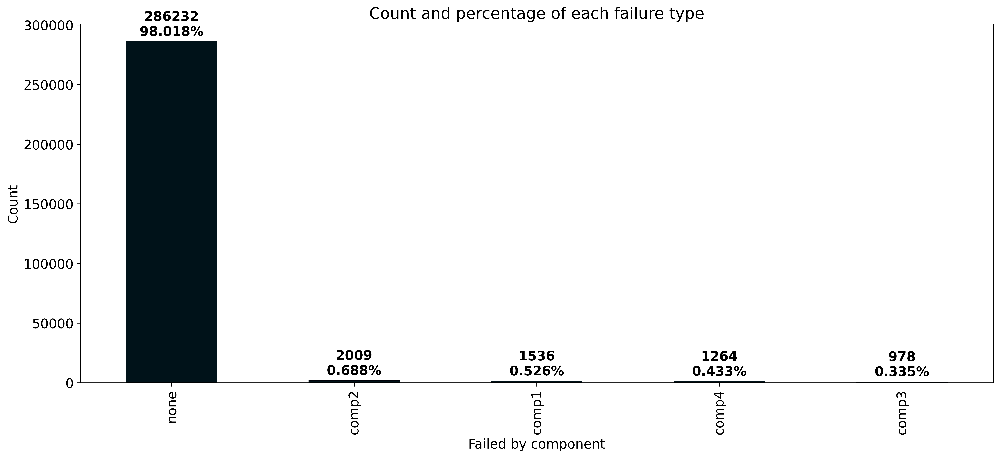

In [34]:
plt.figure(figsize=(15, 7))
ax = pd.Series(y).value_counts().plot(kind='bar')
plt.ylabel('Count')
plt.xlabel('Failed by component')
plt.title('Count and percentage of each failure type')
total = pd.Series(y).count()
for p in ax.patches:
    count = p.get_height()
    percent = '{:.3f}%'.format(100 * count / total)
    ax.annotate(str(count) + '\n' + percent + '\n', (p.get_x() + p.get_width() / 2., p.get_height()),
                va='center', ha='center', fontweight='bold', 
                color='#000', xytext=(0, 10), textcoords='offset points')
plt.show();

<a id="preprocessing-pipeline%3A-one-hot-encoding%2C-standardization"></a>
### 4.2.   Preprocessing Pipeline: One-hot Encoding, Standardization
We need to standardize the continuous or quantitative variables/ features before applying Machine Learning models. This is important because if we don't standardize the features, features with high variance that are orders of magnitude larger that others might dominate the model fitting process and causing the model unable to learn from other features (with lower variance) correctly as expected. <br/>
There is no need to standardize categorical variables.

To know which algorithms require standardization/ feature scaling read this useful [stackoverflow post](https://stats.stackexchange.com/questions/244507/what-algorithms-need-feature-scaling-beside-from-svm).

***Also we need to standardize the data only after performing train-test split because if we standardize before splitting then there is a chance for some information leak from the test set into the train set. We always want the test set to be completely new to the ML models. [Read more](https://scikit-learn.org/stable/modules/compose.html#columntransformer-for-heterogeneous-data)***

In [35]:
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[('onehot', OneHotEncoder(drop='first', dtype=np.int8))]) # np.int8 = 0 to 255, 1 byte. ONLY POSITIVE INTEGERS

## Column Transformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_columns),
        ('cat', categorical_transformer, categorical_columns)],
    remainder='passthrough')

## Applying Column Transformer
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

## Label encoding
y_trans = LabelEncoder()
y_train = y_trans.fit_transform(y_train)
y_test = y_trans.transform(y_test)

In [36]:
# Save feature names after one-hot encoding for feature importances plots
try:
    # if no error occurs
    feature_names = list(preprocessor.named_transformers_['cat'].named_steps['onehot'].get_feature_names_out())
    feature_names = numeric_columns + feature_names
# if an error occurs, get the feature_names from X
except:
    feature_names = list(X.columns)

#### Features after feature selection

In [37]:
print(feature_names)
print(len(feature_names))

['datetime_day_of_month', 'datetime_hour_sin', 'datetime_week', 'comp1', 'age', 'comp2', 'comp4', 'comp3', 'error3count_1', 'error3count_2', 'error5count_1', 'error5count_2', 'error1count_1', 'error1count_2', 'error4count_1', 'error4count_2', 'error4count_3', 'error2count_1', 'error2count_2']
19


In [38]:
list(map(lambda X: X.shape, [X, y, X_train, X_test, y_train, y_test]))

[(292019, 13), (292019,), (204413, 19), (87606, 19), (204413,), (87606,)]

<a id="data-modeling"></a>
## 5.   Data Modeling
Since the dataset is imbalanced we will be using class-weighted/ cost-sensitive learning. In cost-sensitive learning, a weighted cost function is used. Therefore, misclassifying a sample from the minority class will cost the classifiers more than misclassifying a sample from the majority class. In most of the Sklearn classifiers, cost-sensitive learning can be enabled by setting `class_weight='balanced'`.

<a id="utility-functions"></a>
### 5.1.   Utility Functions

In [39]:
def confusion_plot(matrix, labels=None):
    """ Display binary confusion matrix as a Seaborn heatmap """

    # labels = labels if labels else pd.Series(y).unique()
    labels = pd.Series(y).unique()
    
    fig, ax = plt.subplots(nrows=1, ncols=1)
    sns.heatmap(data=matrix, cmap='YlOrRd', annot=True, fmt='d',
                xticklabels=labels, yticklabels=labels, ax=ax)
    ax.set_xlabel('PREDICTED')
    ax.set_ylabel('ACTUAL')
    ax.set_title('Confusion Matrix')
      # Plot the text on each cell
    # for i, j in itertools.product(range(matrix.shape[0]), range(matrix.shape[1])):
    #     plt.text(j, i, f"{matrix[i, j]} ({matrix[i, j]*100:.1f}%)",
    #             horizontalalignment="center")
    plt.close()
    
    return fig

In [40]:
def roc_plot(y_true, y_probs, label, compare=False, ax=None):
    """ Plot Receiver Operating Characteristic (ROC) curve 
        Set `compare=True` to use this function to compare classifiers. """

    # Plotting ROC curve for multi-class classification not working yet
    fpr, tpr, thresh = roc_curve(y_true, y_probs, drop_intermediate=False)
    auc = roc_auc_score(y_true, y_probs, multi_class='ovr', average='weighted')
    # auc = round(roc_auc_score(y_true, y_probs, multi_class='ovr', average='weighted'), 2)
    
    fig, axis = (None, ax) if ax else plt.subplots(nrows=1, ncols=1)
    label = ' '.join([label, f'({auc})']) if compare else None
    sns.lineplot(x=fpr, y=tpr, ax=axis,
                 estimator=None, label=label)
    
    if compare:
        axis.legend(title='Classifier (AUC)', loc='lower right')
    else:
        axis.text(0.72, 0.05, f'AUC = { auc }', fontsize=12,
                  bbox=dict(facecolor='green', alpha=0.4, pad=5))
            
        # Plot No-Info classifier
        axis.fill_between(fpr, fpr, tpr, alpha=0.3, edgecolor='g',
                          linestyle='--', linewidth=2)
        
    axis.set_xlim(0, 1)
    axis.set_ylim(0, 1)
    axis.set_title('ROC Curve')
    axis.set_xlabel('False Positive Rate [FPR]\n(1 - Specificity)')
    axis.set_ylabel('True Positive Rate [TPR]\n(Sensitivity or Recall)')
    
    plt.close()
    
    return axis if ax else fig

In [41]:
def precision_recall_plot(y_true, y_probs, label, compare=False, ax=None):
    """ Plot Precision-Recall curve.
        Set `compare=True` to use this function to compare classifiers. """
    
    # Plotting Precision-Recall curve for multi-class classification not working yet
    p, r, thresh = precision_recall_curve(y_true, y_probs)
    p, r, thresh = list(p), list(r), list(thresh)
    p.pop()
    r.pop()
    
    fig, axis = (None, ax) if ax else plt.subplots(nrows=1, ncols=1)
    
    if compare:
        sns.lineplot(r, p, estimator=None,
                     ax=axis, label=label)
        axis.set_xlabel('Recall')
        axis.set_ylabel('Precision')
        axis.legend(loc='lower left')
    else:
        sns.lineplot(thresh, p, estimator=None,
                     label='Precision', ax=axis)
        axis.set_xlabel('Threshold')
        axis.set_ylabel('Precision')
        axis.legend(loc='lower left')

        axis_twin = axis.twinx()
        sns.lineplot(thresh, r, estimator=None,
                     color='limegreen', label='Recall', ax=axis_twin)
        axis_twin.set_ylabel('Recall')
        axis_twin.set_ylim(0, 1)
        axis_twin.legend(bboX_to_anchor=(0.24, 0.18))
    
    axis.set_xlim(0, 1)
    axis.set_ylim(0, 1)
    axis.set_title('Precision Vs Recall')
    
    plt.close()
    
    return axis if ax else fig

In [42]:
def feature_importance_plot(importances, feature_labels, ax=None):
    fig, axis = (None, ax) if ax else plt.subplots(nrows=1, ncols=1, figsize=(5, 10))
    sns.barplot(x=importances, y=feature_labels, ax=axis)
    axis.set_title('Feature Importance Measures')
    
    plt.close()
    
    return axis if ax else fig

In [43]:
def train_clf(clf, X_train, y_train, sample_weight=None, neural_net=False, refit=False):
    train_time = 0
    
    try:
        if refit:
            raise NotFittedError
        y_pred_train = clf.predict(X_train)
        
        # For neural nets
        if neural_net:
            y_pred_train = y_pred_train.argmax(axis=1) # to get the highest number in the prediction probabilities list
        
    except NotFittedError:
        start = timeit.default_timer()
        
        if sample_weight is not None:
            clf.fit(X_train, y_train, sample_weight=sample_weight)
        else:
            clf.fit(X_train, y_train)
        
        end = timeit.default_timer()
        train_time = end - start
        
        y_pred_train = clf.predict(X_train)
    # print(len(y_pred_train))
    # print(y_pred_train.shape)
    
    train_acc = accuracy_score(y_train, y_pred_train)
    return clf, y_pred_train, train_acc, train_time

In [44]:
def model_memory_size(clf):
    # This function returns the size of the model in Bytes
    buffer = BytesIO()
    joblib.dump(clf, buffer, compress=0) # compress=0 because it's faster (no compression)
    return sys.getsizeof(buffer.getvalue())

In [45]:
def save_ml_model(clf, filename):
    # This function saves the model to a file using joblib
    with open(filename, "wb") as f:
        joblib.dump(clf, f, compress=3) # compress=3 is the default and highest compression

In [46]:
def report(clf, X_train, y_train, X_test, y_test, display_scores=[],
           sample_weight=None, refit=False, importance_plot=False,
           confusion_labels=None, feature_labels=None, neural_net=False,
           verbose=True):
    """ Trains the passed classifier if not already trained and reports
        various metrics of the trained classifier """
    
    dump = dict()
    
    ## Train if not already trained
    clf, train_predictions, \
    train_acc, train_time = train_clf(clf, X_train, y_train,
                                      sample_weight=sample_weight,
                                      neural_net=neural_net,
                                      refit=refit) # error here
    ## Testing
    start = timeit.default_timer()
    test_predictions = clf.predict(X_test)
    end = timeit.default_timer()
    test_time = end - start
    
    # For neural nets
    if neural_net:
        y_probs = np.copy(test_predictions)
        test_predictions = y_probs.argmax(axis=1) # to get the highest number in the prediction probabilities list
    else:
        y_probs = clf.predict_proba(X_test)
    test_acc = accuracy_score(y_test, test_predictions)
    roc_auc = roc_auc_score(y_test, y_probs, multi_class='ovr', average='weighted') # ovr = one vs rest, ovo = one vs one
        
    ## Additional scores
    scores_dict = dict()
    for func in display_scores:
        scores_dict[func.__name__] = [func(y_train, train_predictions, average='weighted'), func(y_test, test_predictions, average='weighted')]
        
    ## Save model and get memory size
    model_mem = None
    if not neural_net:
        ## Save model to disk
        # clf_name = clf.__class__.__name__ # Get the model name
        # timestamp = datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S') # change this to your preferred format
        # model_path = '../../code/machines/models/'
        # file_name = os.path.join(model_path, f'{clf_name}_{timestamp}.sav') # concatenate the model name and timestamp with .h5 extension
        # save_ml_model(clf, file_name)
        
        ## Get the model memory size
        model_mem = model_memory_size(clf) / 1024
        # model_mem = round(model_memory_size(clf) / 1024, 2)
    
    print(clf)
    print("\n=============================> TRAIN-TEST DETAILS <======================================")
    
    ## Metrics
    print(f"Train Size: {X_train.shape[0]} samples")
    print(f" Test Size: {X_test.shape[0]} samples")
    print("---------------------------------------------")
    print(f"Training Time: {train_time} seconds")
    print(f" Testing Time: {test_time} seconds")
    # print(f"Training Time: {round(train_time, 3)} seconds")
    # print(f" Testing Time: {round(test_time, 3)} seconds")
    print("---------------------------------------------")
    print("Train Accuracy: ", train_acc)
    print(" Test Accuracy: ", test_acc)
    print("---------------------------------------------")
    
    if display_scores:
        for k, v in scores_dict.items():
            score_name = ' '.join(map(lambda x: x.title(), k.split('_')))
            print(f'Train {score_name}: ', v[0])
            print(f' Test {score_name}: ', v[1])
            print()
        print("---------------------------------------------")
    
    print(" Area Under ROC (test): ", roc_auc)
    print("---------------------------------------------")
    print(f"Model Memory Size: {model_mem} kB")
    print("\n=============================> CLASSIFICATION REPORT <===================================")
    
    ## Classification Report
    clf_rep = classification_report(y_test, test_predictions, output_dict=True)
    
    print(classification_report(y_test, test_predictions,
                                target_names=confusion_labels))   
    
    if verbose:
        print("\n================================> CONFUSION MATRIX <=====================================")
    
        ## Confusion Matrix HeatMap
        display(confusion_plot(confusion_matrix(y_test, test_predictions), labels=confusion_labels))
        # print("\n=======================================> PLOTS <=========================================")

        ## Variable importance plot
        # fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
        # # roc_axes = axes[0, 0]
        # # pr_axes = axes[0, 1]
        # importances = None

        # if importance_plot:
        #     if not feature_labels:
        #         raise RuntimeError("'feature_labels' argument not passed "
        #                            "when 'importance_plot' is True")

        #     try:
        #         importances = pd.Series(clf.feature_importances_,
        #                                 index=feature_labels) \
        #                         .sort_values(ascending=False)
        #     except AttributeError:
        #         try:
        #             importances = pd.Series(clf.coef_.ravel(),
        #                                     index=feature_labels) \
        #                             .sort_values(ascending=False)
        #         except AttributeError:
        #             pass

        #     if importances is not None:
        #         # Modifying grid
        #         grid_spec = axes[0, 0].get_gridspec()
        #         for ax in axes[:, 0]:
        #             ax.remove()   # remove first column axes
        #         large_axs = fig.add_subplot(grid_spec[0:, 0])

        #         # Plot importance curve
        #         feature_importance_plot(importances=importances.values,
        #                                 feature_labels=importances.index,
        #                                 ax=large_axs)
        #         large_axs.axvline(x=0)

        #         # Axis for ROC and PR curve
        #         # roc_axes = axes[0, 1]
        #         # pr_axes = axes[1, 1]
        #     else:
        #         # remove second row axes
        #         for ax in axes[1, :]:
        #             ax.remove()
        # else:
        #     # remove second row axes
        #     for ax in axes[1, :]:
        #         ax.remove()

        ## ROC and Precision-Recall curves
        # clf_name = clf.__class__.__name__
        # roc_plot(y_test, y_probs, clf_name, ax=roc_axes)
        # precision_recall_plot(y_test, y_probs, clf_name, ax=pr_axes)

        # fig.subplots_adjust(wspace=5)
        # fig.tight_layout()
        # display(fig)
    
    ## Dump to report_dict
    dump = dict(clf=clf, accuracy=[train_acc, test_acc], **scores_dict,
                train_time=train_time, train_predictions=train_predictions,
                test_time=test_time, test_predictions=test_predictions,
                test_probs=y_probs, report=clf_rep, roc_auc=roc_auc,
                model_memory=model_mem)
    
    return clf, dump

In [47]:
def compare_models(y_test=None, clf_reports=[], labels=[], score='f1-score'):
    """ Compare evaluation metrics for the True Positive class [1] of 
        binary classifiers passed in the argument and plot ROC and PR curves.
        
        Arguments:
        ---------
        y_test: to plot ROC and Precision-Recall curves
         score: is the name corresponding to the sklearn metrics
        
        Returns:
        -------
        compare_table: pandas DataFrame containing evaluated metrics
                  fig: `matplotlib` figure object with ROC and PR curves """
    
    ## Classifier Labels
    default_names = [rep['clf'].__class__.__name__ for rep in clf_reports]
    clf_names =  labels if len(labels) == len(clf_reports) else default_names
    
    
    ## Compare Table
    table = dict()
    index = ['Train ' + score, 'Test ' + score, 'Overfitting', 'Train Accuracy', 'Test Accuracy', 'Test ROC-AUC']
            #  'Precision', 'Recall', 'F1-score', 'Support']
    for i in range(len(clf_reports)):
        scores = clf_reports[i][score]
        # scores = [round(i, 3) for i in clf_reports[i][score]]
        
        roc_auc = clf_reports[i]['roc_auc']
        train_acc = clf_reports[i]['accuracy'][0]
        test_acc = clf_reports[i]['accuracy'][1]
        
        # Get metrics of True Positive class from sklearn classification_report
        # true_positive_metrics = list(clf_reports[i]['report']["1"].values())
        
        table[clf_names[i]] = scores + [scores[1] < scores[0], train_acc, test_acc, roc_auc]
        # table[clf_names[i]] = scores + [scores[1] < scores[0], test_acc, roc_auc] + true_positive_metrics
    
    table = pd.DataFrame(data=table, index=index)
    
    ## Compare Plots
    # fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
    
    # # ROC and Precision-Recall
    # for i in range(len(clf_reports)):
    #     clf_probs = clf_reports[i]['test_probs']
    #     roc_plot(y_test, clf_probs, label=clf_names[i],
    #              compare=True, ax=axes[0])
    #     precision_recall_plot(y_test, clf_probs, label=clf_names[i],
    #                           compare=True, ax=axes[1])
    # # Plot No-Info classifier
    # axes[0].plot([0,1], [0,1], linestyle='--', color='green')
        
    # fig.tight_layout()
    # plt.close()
    
    # return table.T, fig
    return table.T

### Set primary metric to be used

In [48]:
# primary_eval_metric = metrics.accuracy_score
primary_eval_metric = metrics.f1_score

In [49]:
confusion_lbs = pd.Series(y).unique()
print(confusion_lbs)

['none', 'comp1', 'comp4', 'comp3', 'comp2']
Categories (5, object): ['comp1', 'comp2', 'comp3', 'comp4', 'none']


#### Load trained ML model

In [50]:
# load the model from disk
filename = '../../code/machines/models/cnn_lstm_modelNN/cnn_lstm_modelNN-2023.h5'
cnn_lstm_modelNN = load_model(filename)

In [51]:
cnn_lstm_modelNN.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (BatchN  (None, 19)               76        
 ormalization)                                                   
                                                                 
 reshape (Reshape)           (None, 19, 1, 1)          0         
                                                                 
 conv_lstm1d (ConvLSTM1D)    (None, 19, 1, 4)          96        
                                                                 
 flatten (Flatten)           (None, 76)                0         
                                                                 
 dropout (Dropout)           (None, 76)                0         
                                                                 
 dense (Dense)               (None, 5)                 385       
                                                        

In [52]:
# _, cnn_lstm_nn_report = report(cnn_lstm_modelNN, X_train, y_train,
#                       X_test, y_test,
#                     #   display_scores=[metrics.accuracy_score],
#                       display_scores=[primary_eval_metric],
#                       refit=False,
#                       importance_plot=False,
#                       confusion_labels=confusion_lbs,
#                       neural_net=True)

In [53]:
# report_list = [
# cnn_lstm_nn_report
# ]
# clf_labels = [rep['clf'].__class__.__name__ for rep in report_list]

# clf_labels[-1] = 'Convolutional LSTM Neural Net'

In [54]:
# compare_table = compare_models(y_test, clf_reports=report_list,
#                                              labels=clf_labels,
#                                              score=primary_eval_metric.__name__)
# compare_table.sort_values(by=['Test f1_score', 'Overfitting'], ascending=[False, False])

<a id="xai"></a>
### 5.2. Explainable Machine Learning

In [55]:
# Get target variable
target_variable = df_pdm_machines.columns[-1]

In [56]:
df_pdm_machines.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292019 entries, 0 to 292018
Data columns (total 37 columns):
 #   Column                  Non-Null Count   Dtype   
---  ------                  --------------   -----   
 0   volt_lag_mean_3h        292019 non-null  float32 
 1   rotate_lag_mean_3h      292019 non-null  float32 
 2   pressure_lag_mean_3h    292019 non-null  float32 
 3   vibration_lag_mean_3h   292019 non-null  float32 
 4   volt_lag_sd_3h          292019 non-null  float32 
 5   rotate_lag_sd_3h        292019 non-null  float32 
 6   pressure_lag_sd_3h      292019 non-null  float32 
 7   vibration_lag_sd_3h     292019 non-null  float32 
 8   volt_lag_mean_24h       292019 non-null  float32 
 9   rotate_lag_mean_24h     292019 non-null  float32 
 10  pressure_lag_mean_24h   292019 non-null  float32 
 11  vibration_lag_mean_24h  292019 non-null  float32 
 12  volt_lag_sd_24h         292019 non-null  float32 
 13  rotate_lag_sd_24h       292019 non-null  float32 
 14  pres

In [57]:
df_pdm_machines.head(3)

,volt_lag_mean_3h,rotate_lag_mean_3h,pressure_lag_mean_3h,vibration_lag_mean_3h,volt_lag_sd_3h,rotate_lag_sd_3h,pressure_lag_sd_3h,vibration_lag_sd_3h,volt_lag_mean_24h,rotate_lag_mean_24h,pressure_lag_mean_24h,vibration_lag_mean_24h,volt_lag_sd_24h,rotate_lag_sd_24h,pressure_lag_sd_24h,vibration_lag_sd_24h,error1count,error2count,error3count,error4count,error5count,comp1,comp2,comp3,comp4,age,datetime_month,datetime_week,datetime_day_of_week,datetime_day_of_month,datetime_hour,datetime_weekend,datetime_month_sin,datetime_month_cos,datetime_hour_sin,datetime_hour_cos,failure
0,167.694336,437.208893,94.930054,40.247875,9.150737,15.576324,17.636868,3.283246,169.368378,450.479523,96.100517,39.821854,11.344186,56.997864,9.632777,4.672664,0,0,0,0,0,199.125,139.125,169.125,34.125,7,1,1,3,1,9,0,0.5,0.866025,0.433884,-0.900969,none
1,176.972458,482.494965,99.352455,33.345875,10.233862,31.894785,11.060139,4.651387,173.228378,452.886475,100.159653,37.333725,12.622225,59.955311,12.204017,5.097741,0,0,0,0,0,139.125,34.125,199.125,184.125,8,1,1,3,1,9,0,0.5,0.866025,0.433884,-0.900969,none
2,168.919907,472.071777,90.042809,45.859760,11.682536,62.903927,7.567760,8.025867,169.122009,456.221405,99.904404,39.504959,12.179081,61.278572,8.771438,3.869699,0,0,0,0,0,154.125,199.125,49.125,19.125,7,1,1,3,1,9,0,0.5,0.866025,0.433884,-0.900969,none


Prep needed for Data checks and SHAP values

**Age, datetime_day_of_month, datetime_hour_sin, and datetime_week, have become float values due to Standardisation**

Create **df_train** (A dataframe of training set values)

In [58]:
# Convert y_train to a DataFrame with column name target_variable
y_train_df = pd.DataFrame({target_variable: y_train})

# Combine X_train and y_train_df, while setting X_train column names to feature_names
df_train = pd.concat([pd.DataFrame(X_train, columns=feature_names), y_train_df], axis=1)

# # Exclude encoding of failure column for easy explainability
# to_cast = return_categoricals(df_train.loc[:, df_train.columns != 'failure'], threshold=5)
# df_train = to_categorical(to_cast, df_train.loc[:, df_train.columns != 'failure'])
# df_train = PandaReducer().reduce(df_train)
# df_train['failure'] = target_variable
# df_train.info()

to_cast = return_categoricals(df_train, threshold=5)
df_train = to_categorical(to_cast, df_train)
df_train = PandaReducer().reduce(df_train)
df_train.info()

Dataset reduced 0.02% : 8.58 to 8.58 MB in 0.21 seconds
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 204413 entries, 0 to 204412
Data columns (total 20 columns):
 #   Column                 Non-Null Count   Dtype   
---  ------                 --------------   -----   
 0   datetime_day_of_month  204413 non-null  float32 
 1   datetime_hour_sin      204413 non-null  float32 
 2   datetime_week          204413 non-null  float32 
 3   comp1                  204413 non-null  float32 
 4   age                    204413 non-null  float32 
 5   comp2                  204413 non-null  float32 
 6   comp4                  204413 non-null  float32 
 7   comp3                  204413 non-null  float32 
 8   error3count_1          204413 non-null  category
 9   error3count_2          204413 non-null  category
 10  error5count_1          204413 non-null  category
 11  error5count_2          204413 non-null  category
 12  error1count_1          204413 non-null  category
 13  error1count_2     

In [59]:
(df_train.head(3))

,datetime_day_of_month,datetime_hour_sin,datetime_week,comp1,age,comp2,comp4,comp3,error3count_1,error3count_2,error5count_1,error5count_2,error1count_1,error1count_2,error4count_1,error4count_2,error4count_3,error2count_1,error2count_2,failure
0,-1.62212,0.656921,-1.730015,2.101052,-0.742932,1.278897,-0.369327,1.718442,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4
1,-1.62212,0.656921,-1.730015,1.213792,-0.571331,-0.324718,1.984506,2.180184,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4
2,-1.62212,0.656921,-1.730015,1.435607,-0.742932,2.195248,-0.604710,-0.128529,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4


In [60]:
(df_train.shape)

(204413, 20)

In [61]:
# Save to CSV
# df_train.to_csv("../../data/d_machines_cleaned/df_train.csv", index=False, header=True)

Create **df_test** (A dataframe of testing set values)

In [62]:
# Convert y_test to a DataFrame with column name target_variable
y_test_df = pd.DataFrame({target_variable: y_test})

# Combine X_test and y_test_df, while setting X_train column names to feature_names
df_test = pd.concat([pd.DataFrame(X_test, columns=feature_names), y_test_df], axis=1)

# # Exclude encoding of failure column for easy explainability
# to_cast = return_categoricals(df_test.loc[:, df_test.columns != 'failure'], threshold=5)
# df_test = to_categorical(to_cast, df_test.loc[:, df_test.columns != 'failure'])
# df_test = PandaReducer().reduce(df_test)
# df_test['failure'] = target_variable
# df_test.info()

to_cast = return_categoricals(df_test, threshold=5)
df_test = to_categorical(to_cast, df_test)
df_test = PandaReducer().reduce(df_test)
df_test.info()

Dataset reduced 0.04% : 3.68 to 3.68 MB in 0.20 seconds
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87606 entries, 0 to 87605
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   datetime_day_of_month  87606 non-null  float32 
 1   datetime_hour_sin      87606 non-null  float32 
 2   datetime_week          87606 non-null  float32 
 3   comp1                  87606 non-null  float32 
 4   age                    87606 non-null  float32 
 5   comp2                  87606 non-null  float32 
 6   comp4                  87606 non-null  float32 
 7   comp3                  87606 non-null  float32 
 8   error3count_1          87606 non-null  category
 9   error3count_2          87606 non-null  category
 10  error5count_1          87606 non-null  category
 11  error5count_2          87606 non-null  category
 12  error1count_1          87606 non-null  category
 13  error1count_2          87606 non-nu

In [63]:
(df_test.head(3))

,datetime_day_of_month,datetime_hour_sin,datetime_week,comp1,age,comp2,comp4,comp3,error3count_1,error3count_2,error5count_1,error5count_2,error1count_1,error1count_2,error4count_1,error4count_2,error4count_3,error2count_1,error2count_2,failure
0,-0.259507,0.00107,1.686098,-0.479397,-0.742932,-0.011631,-0.283020,-0.505619,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4
1,-0.259507,0.00107,1.686098,-0.730787,1.487878,-0.500352,1.097895,-0.074659,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4
2,-0.259507,0.00107,1.686098,-0.686424,0.801475,-0.454534,-0.267328,-0.028485,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4


In [64]:
(df_test.shape)

(87606, 20)

In [65]:
# Save to CSV
# df_test.to_csv("../../data/d_machines_cleaned/df_test.csv", index=False, header=True)

Prep needed for Counterfactuals
- Note that the entire dataset is used because no Counterfactuals were found when using **df_train** and **df_test** separately
- This only happens when generating Counterfactuals using Deep Learing models, which asserts that DL models need more data than "traditional" ML models

Create **xai_df** (A dataframe for XAI operations)

In [66]:
# Convert y_train to a DataFrame with column name target_variable
xai_df = pd.concat([df_train, df_test], axis=0) # combine train and test rowise

# # Exclude encoding of failure column for easy explainability
# to_cast = return_categoricals(xai_df.loc[:, xai_df.columns != 'failure'], threshold=5)
# xai_df = to_categorical(to_cast, xai_df.loc[:, xai_df.columns != 'failure'])
# xai_df = PandaReducer().reduce(xai_df)
# xai_df['failure'] = target_variable
# xai_df.info()

to_cast = return_categoricals(xai_df, threshold=5)
xai_df = to_categorical(to_cast, xai_df)
xai_df = PandaReducer().reduce(xai_df)
xai_df.info()

Dataset reduced 0.01% : 14.48 to 14.48 MB in 0.48 seconds
<class 'pandas.core.frame.DataFrame'>
Int64Index: 292019 entries, 0 to 87605
Data columns (total 20 columns):
 #   Column                 Non-Null Count   Dtype   
---  ------                 --------------   -----   
 0   datetime_day_of_month  292019 non-null  float32 
 1   datetime_hour_sin      292019 non-null  float32 
 2   datetime_week          292019 non-null  float32 
 3   comp1                  292019 non-null  float32 
 4   age                    292019 non-null  float32 
 5   comp2                  292019 non-null  float32 
 6   comp4                  292019 non-null  float32 
 7   comp3                  292019 non-null  float32 
 8   error3count_1          292019 non-null  category
 9   error3count_2          292019 non-null  category
 10  error5count_1          292019 non-null  category
 11  error5count_2          292019 non-null  category
 12  error1count_1          292019 non-null  category
 13  error1count_2    

In [67]:
(xai_df.head(3))

,datetime_day_of_month,datetime_hour_sin,datetime_week,comp1,age,comp2,comp4,comp3,error3count_1,error3count_2,error5count_1,error5count_2,error1count_1,error1count_2,error4count_1,error4count_2,error4count_3,error2count_1,error2count_2,failure
0,-1.62212,0.656921,-1.730015,2.101052,-0.742932,1.278897,-0.369327,1.718442,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4
1,-1.62212,0.656921,-1.730015,1.213792,-0.571331,-0.324718,1.984506,2.180184,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4
2,-1.62212,0.656921,-1.730015,1.435607,-0.742932,2.195248,-0.604710,-0.128529,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4


In [68]:
(xai_df.shape)

(292019, 20)

In [69]:
# Save to CSV
# xai_df.to_csv("../../data/d_machines_cleaned/xai_df.csv", index=False, header=True)

Prep for Data checks

In [71]:
#Creating Deepchecks object for Data Purity Checks
ds = Dataset(xai_df, 
             cat_features= list(xai_df.select_dtypes(include='category').columns
                                .drop(target_variable)
                                ), # select categorical features but exclude target variable
             label=target_variable)

In [72]:
ds.columns_info

{'datetime_day_of_month': 'numerical feature',
 'datetime_hour_sin': 'numerical feature',
 'datetime_week': 'numerical feature',
 'comp1': 'numerical feature',
 'age': 'numerical feature',
 'comp2': 'numerical feature',
 'comp4': 'numerical feature',
 'comp3': 'numerical feature',
 'error3count_1': 'categorical feature',
 'error3count_2': 'categorical feature',
 'error5count_1': 'categorical feature',
 'error5count_2': 'categorical feature',
 'error1count_1': 'categorical feature',
 'error1count_2': 'categorical feature',
 'error4count_1': 'categorical feature',
 'error4count_2': 'categorical feature',
 'error4count_3': 'categorical feature',
 'error2count_1': 'categorical feature',
 'error2count_2': 'categorical feature',
 'failure': 'label',
 'original_df_index': 'other'}

In [73]:
#Creating Deepchecks object for Data Consistency Checks and model evaluation
train_ds = Dataset(df_train, label=target_variable, 
                   cat_features=list(df_train.select_dtypes(include='category').columns
                                .drop(target_variable)
                                ))
test_ds = Dataset(df_test, label=target_variable, 
                  cat_features=list(df_test.select_dtypes(include='category').columns
                                .drop(target_variable)
                                ))

In [74]:
train_ds.columns_info

{'datetime_day_of_month': 'numerical feature',
 'datetime_hour_sin': 'numerical feature',
 'datetime_week': 'numerical feature',
 'comp1': 'numerical feature',
 'age': 'numerical feature',
 'comp2': 'numerical feature',
 'comp4': 'numerical feature',
 'comp3': 'numerical feature',
 'error3count_1': 'categorical feature',
 'error3count_2': 'categorical feature',
 'error5count_1': 'categorical feature',
 'error5count_2': 'categorical feature',
 'error1count_1': 'categorical feature',
 'error1count_2': 'categorical feature',
 'error4count_1': 'categorical feature',
 'error4count_2': 'categorical feature',
 'error4count_3': 'categorical feature',
 'error2count_1': 'categorical feature',
 'error2count_2': 'categorical feature',
 'failure': 'label'}

In [75]:
test_ds.columns_info

{'datetime_day_of_month': 'numerical feature',
 'datetime_hour_sin': 'numerical feature',
 'datetime_week': 'numerical feature',
 'comp1': 'numerical feature',
 'age': 'numerical feature',
 'comp2': 'numerical feature',
 'comp4': 'numerical feature',
 'comp3': 'numerical feature',
 'error3count_1': 'categorical feature',
 'error3count_2': 'categorical feature',
 'error5count_1': 'categorical feature',
 'error5count_2': 'categorical feature',
 'error1count_1': 'categorical feature',
 'error1count_2': 'categorical feature',
 'error4count_1': 'categorical feature',
 'error4count_2': 'categorical feature',
 'error4count_3': 'categorical feature',
 'error2count_1': 'categorical feature',
 'error2count_2': 'categorical feature',
 'failure': 'label'}

Mapping numerical labels back to class labels for easy explainability:
- 'comp1'= class 0
- 'comp2'= class 1
- 'comp3'= class 2
- 'comp4'= class 3
- 'none'= class 4

In [76]:
# Get unique class labels and their corresponding numerical labels
unique_class_labels = y_trans.classes_
class_label_mapping = {label: i for i, label in enumerate(unique_class_labels)}

In [77]:
class_label_mapping

{'comp1': 0, 'comp2': 1, 'comp3': 2, 'comp4': 3, 'none': 4}

Get index of first instances of each class

In [78]:
# Create a dictionary to store the first instance index for each class
first_instance_indices = {}

# Iterate over the unique classes
unique_classes = df_test[target_variable].unique()
for class_label in unique_classes:
    # Find the first instance index of the class
    first_instance_index = df_test[df_test[target_variable] == class_label].index[0]
    first_instance_indices[class_label] = first_instance_index

# List of first instance indexes for each class
first_instance_index_list = list(first_instance_indices.values())

In [79]:
first_instance_index_list

[0, 67, 73, 85, 2089]

In [80]:
# Create a list to store tuples of (class label, first instance index)
class_and_index_list = []

# Iterate over the unique classes
unique_classes = df_test[target_variable].unique()
for class_label in unique_classes:
    # Find the first instance index of the class
    first_instance_index = df_test[df_test[target_variable] == class_label].index[0]
    class_and_index_list.append((class_label, first_instance_index))

# List of class label and first instance index tuples
class_and_index_list

# (4, 0) -> (class label, first instance index), (class 4, index 0)

[(4, 0), (3, 67), (1, 73), (0, 85), (2, 2089)]

Recall numerical labels and class labels mappings:
- 'comp1'= class 0
- 'comp2'= class 1
- 'comp3'= class 2
- 'comp4'= class 3
- 'none'= class 4

### Data explanations

Data Purity check (for whole dataset)

In [81]:
# # Run Suite:
# integ_suite = data_integrity(n_samples = len(ds)//2, timeout = 600, n_top_columns=50, random_state=rng, n_to_show=50)
# suite_result_data = integ_suite.run(ds)
# # Note: the result can be saved as html using suite_result_data.save_as_html()
# # or exported to json using suite_result_data.to_json()
# suite_result_data.save_as_html("./Assets/DL-suite_result_data_deepchecks_results.html")
# suite_result_data.show()

Accordion(children=(VBox(children=(HTML(value='\n<h1 id="summary_1RTGPHUDG80T57L99E4B9VJJA">Data Integrity Sui…

Data Consistency check (for train test)

In [82]:
# validation_suite = train_test_validation(n_samples = len(train_ds)//2, timeout = 600, n_top_columns=50, random_state=rng, n_to_show=50)
# suite_result_validation = validation_suite.run(train_ds, test_ds)
# # Note: the result can be saved as html using suite_result_validation.save_as_html()
# # or exported to json using suite_result_validation.to_json()
# suite_result_validation.save_as_html("./Assets/DL-suite_result_validation_deepchecks_results.html")
# suite_result_validation.show()

Accordion(children=(VBox(children=(HTML(value='\n<h1 id="summary_HE5VQUT0NA6FFRMJ23XQCCJ5B">Train Test Validat…

Data check (for model evaluation)

In [83]:
# evaluation_suite = model_evaluation(n_samples = len(train_ds)//2, timeout = 600, n_top_columns=50, random_state=rng, n_to_show=50)
# suite_result_model = evaluation_suite.run(train_ds, test_ds, cnn_lstm_modelNN)
# # Note: the result can be saved as html using suite_result_model.save_as_html()
# # or exported to json using suite_result_model.to_json()
# suite_result_model.save_as_html("./Assets/DL-suite_result_model_deepchecks_results.html")
# suite_result_model.show()

2738/2738 [==============================] - 59s 22ms/step


1/1 [==============================] - 0s 42ms/step


deepchecks - WARNING - Could not find built-in feature importance on the model, using permutation feature importance calculation instead


1/1 [==============================] - 0s 45ms/step


deepchecks - WARNING - Could not find built-in feature importance on the model, using permutation feature importance calculation instead


2738/2738 [==============================] - 57s 21ms/step


Accordion(children=(VBox(children=(HTML(value='\n<h1 id="summary_J07M1LGCL4NGQ4193E2RC6RLZ">Model Evaluation S…

### SHAP explanations

In [93]:
# Here we use a selection of samples from the dataset to represent "typical" feature values, and then use a number of perterbation samples to estimate the SHAP values for a given prediction. Eg. Note that this requires 500 * 50 evaluations of the model.

sample_size = 25

X_sub = shap.sample(df_train.drop(target_variable, axis=1), sample_size)

# Create object that can calculate shap values
explainer = shap.Explainer(cnn_lstm_modelNN.predict, X_sub, random_seed = rng)
# explainer = shap.Explainer(cnn_lstm_modelNN.predict_proba, X_sub, random_seed = rng)

Looking at class 4 from index 0

In [94]:
df_test[0:1]

,datetime_day_of_month,datetime_hour_sin,datetime_week,comp1,age,comp2,comp4,comp3,error3count_1,error3count_2,error5count_1,error5count_2,error1count_1,error1count_2,error4count_1,error4count_2,error4count_3,error2count_1,error2count_2,failure
0,-0.259507,0.00107,1.686098,-0.479397,-0.742932,-0.011631,-0.28302,-0.505619,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4


In [81]:
# Calculate Shap values for a single prediction
# shap_values = explainer(df_test[0:1].drop(target_variable, axis=1))

In [82]:
# (len(shap_values))

In [83]:
# class_index = 4
# data_index = 0

Explain a single prediction (local)

Visualize local features

In [84]:
# # Local explainability: Summary Plot
# plt.title('Local Feature Attribution using SHAP')
# # shap.plots.waterfall(shap_values[data_index,:,class_index])
# shap.plots.bar(shap_values[data_index,:,class_index], show=True, max_display=50)
# # shap.force_plot(shap_values[data_index,:,class_index])

14/14 [==============================] - 0s 19ms/step


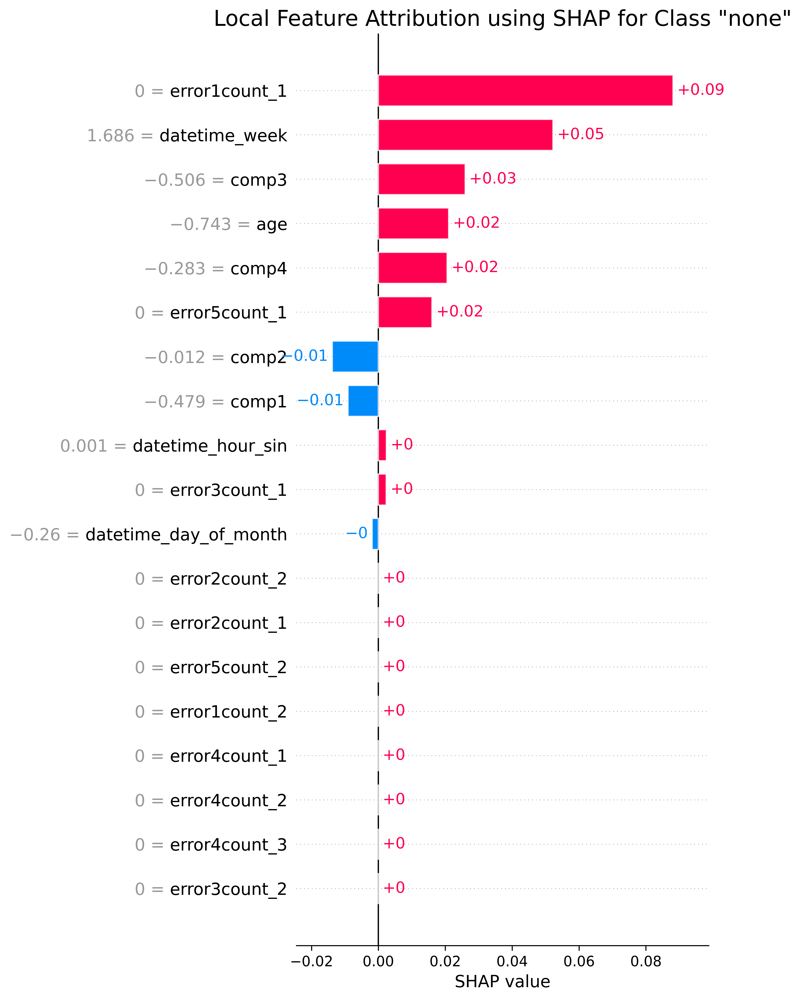

15/15 [==============================] - 0s 21ms/step


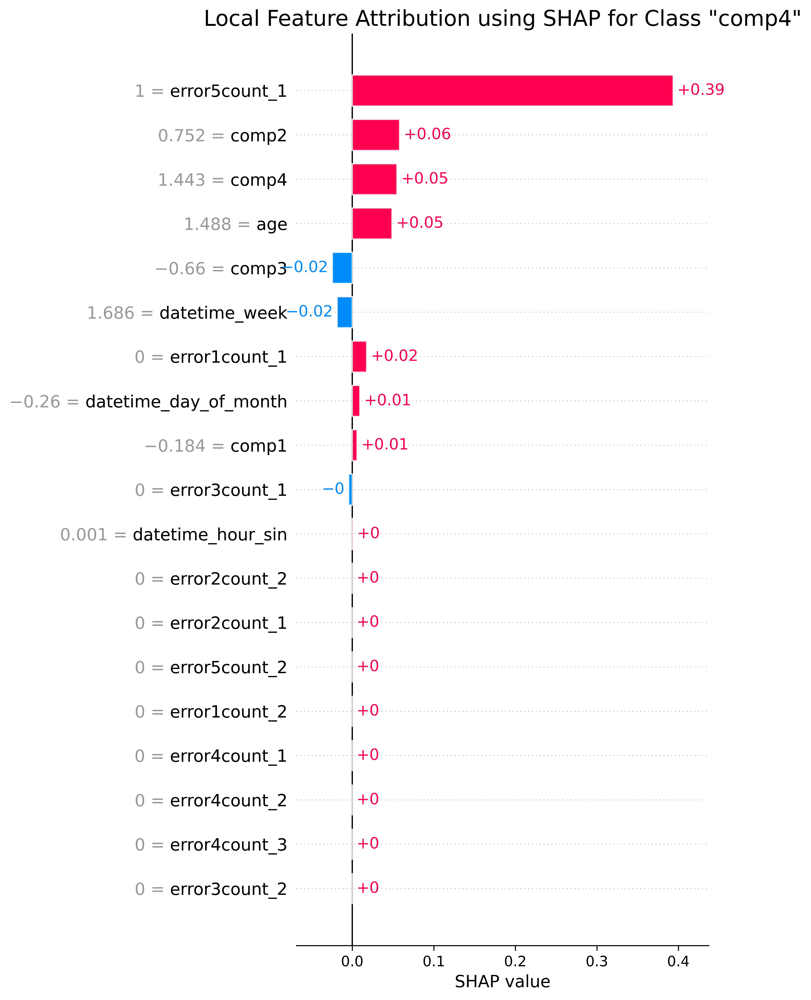

17/17 [==============================] - 0s 21ms/step


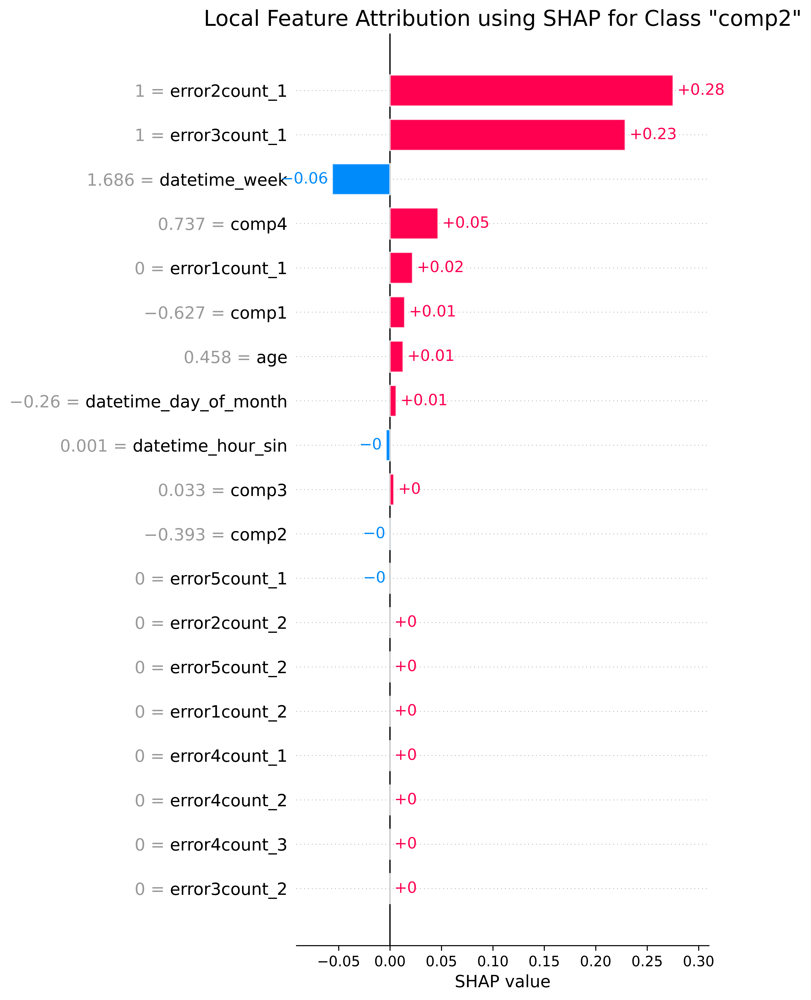

15/15 [==============================] - 0s 24ms/step


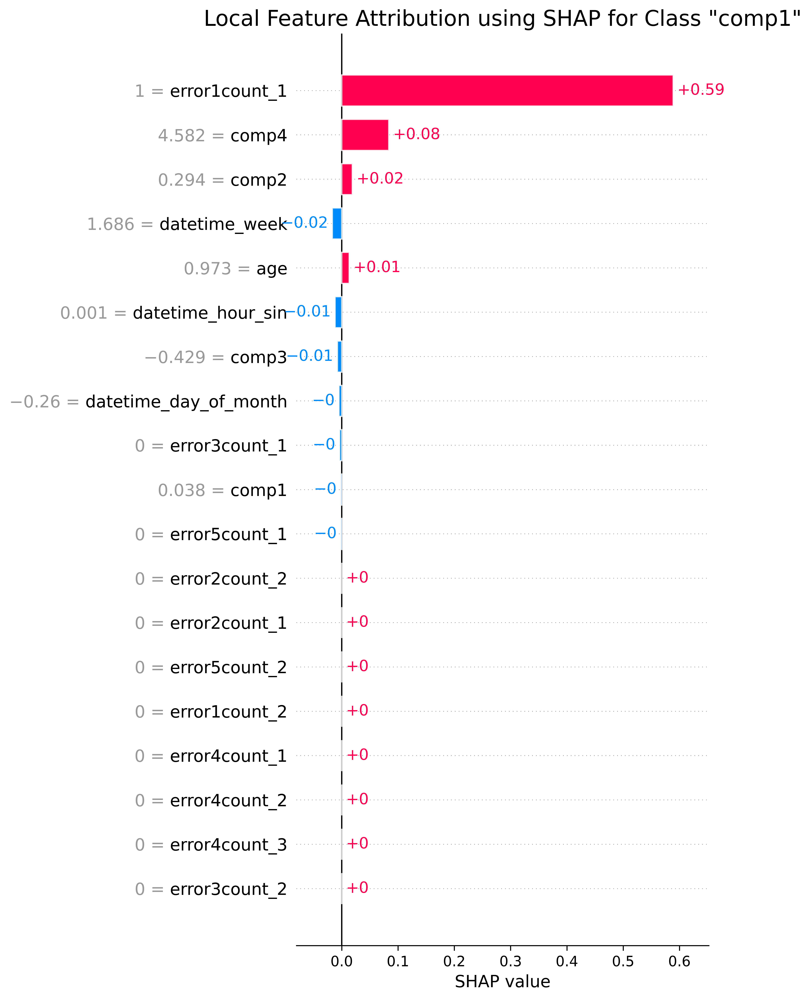

16/16 [==============================] - 0s 20ms/step


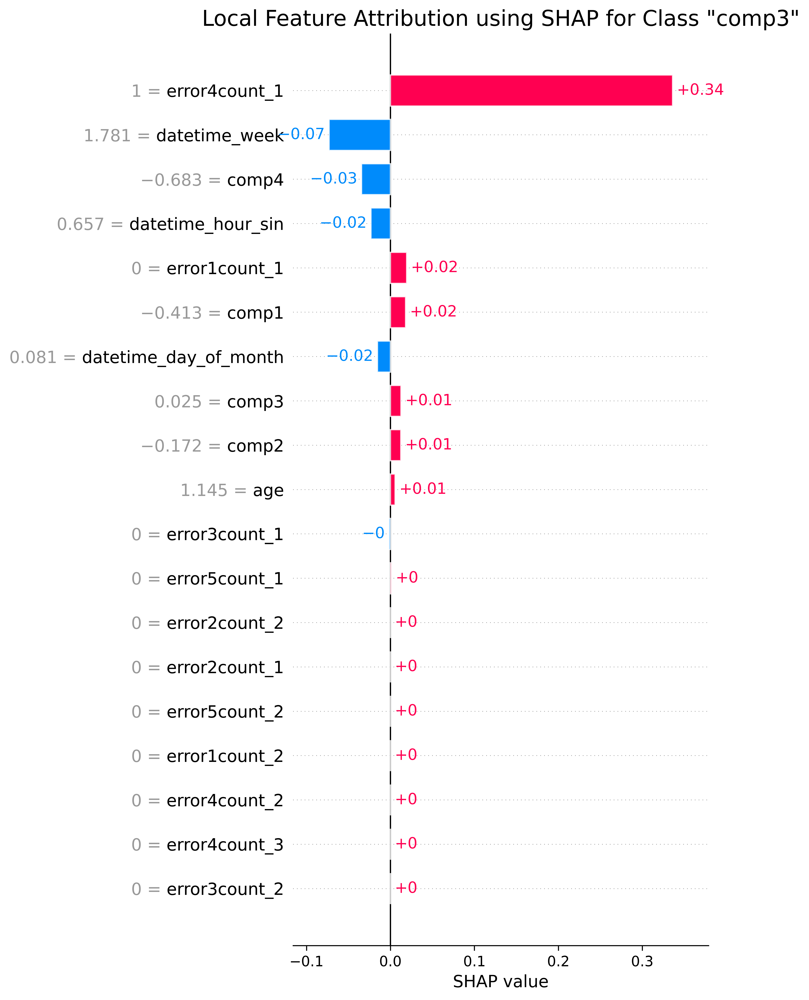

In [95]:
# Calculate Shap values for each class index and data index

# Recall numerical labels and class labels mappings:
# - 'comp1'= class 0
# - 'comp2'= class 1
# - 'comp3'= class 2
# - 'comp4'= class 3
# - 'none'= class 4

# Define the class indices and data indices
indices = [(4, 0), (3, 67), (1, 73), (0, 85), (2, 2089)]

for class_index, data_index in indices:
    # Check if the column exists before dropping
    if target_variable in df_test.columns:
        data = df_test[data_index:data_index+1].drop(target_variable, axis=1)
    else:
        data = df_test[data_index:data_index+1]

    shap_values = explainer(data)

    # Get the class label from the mapping
    class_label = unique_class_labels[class_index]

    # Local explainability: Summary Plot
    # plt.title(f'Local Feature Attribution using SHAP for Class "{class_label}" (Class index {class_index}) and Data Index {data_index}')
    plt.title(f'Local Feature Attribution using SHAP for Class "{class_label}"')
    shap.plots.bar(shap_values[0,:,class_index], show=True, max_display=50, show_data=True)

In [96]:
# # Here we repeat the above explanation process for sample_size individuals. Since we are using a sampling based approximation each explanation can take a couple seconds depending on your machine setup.

# # Calculate Shap values for many predictions
# shap_values_multiple = explainer(df_test[0:sample_size].drop(target_variable, axis=1))

9/9 [==============================] - 0s 29ms/step


Permutation explainer:   8%|▊         | 2/25 [00:00<?, ?it/s]

8/8 [==============================] - 0s 20ms/step


Permutation explainer:  16%|█▌        | 4/25 [00:24<01:20,  3.85s/it]

9/9 [==============================] - 0s 29ms/step


Permutation explainer:  20%|██        | 5/25 [00:32<01:51,  5.58s/it]

9/9 [==============================] - 0s 23ms/step


Permutation explainer:  24%|██▍       | 6/25 [00:40<02:02,  6.46s/it]

9/9 [==============================] - 0s 19ms/step


Permutation explainer:  28%|██▊       | 7/25 [00:47<02:02,  6.78s/it]

8/8 [==============================] - 0s 20ms/step


Permutation explainer:  32%|███▏      | 8/25 [00:55<01:59,  7.02s/it]

10/10 [==============================] - 0s 19ms/step


Permutation explainer:  36%|███▌      | 9/25 [01:02<01:53,  7.12s/it]

9/9 [==============================] - 0s 33ms/step


Permutation explainer:  40%|████      | 10/25 [01:10<01:48,  7.25s/it]

9/9 [==============================] - 0s 28ms/step


Permutation explainer:  44%|████▍     | 11/25 [01:17<01:42,  7.33s/it]

9/9 [==============================] - 0s 19ms/step


Permutation explainer:  48%|████▊     | 12/25 [01:25<01:35,  7.37s/it]

9/9 [==============================] - 0s 30ms/step


Permutation explainer:  52%|█████▏    | 13/25 [01:33<01:31,  7.60s/it]

11/11 [==============================] - 0s 28ms/step


Permutation explainer:  56%|█████▌    | 14/25 [01:44<01:34,  8.55s/it]

10/10 [==============================] - 0s 23ms/step


Permutation explainer:  60%|██████    | 15/25 [01:53<01:27,  8.78s/it]

10/10 [==============================] - 0s 28ms/step


Permutation explainer:  64%|██████▍   | 16/25 [02:02<01:19,  8.81s/it]

10/10 [==============================] - 0s 24ms/step


Permutation explainer:  68%|██████▊   | 17/25 [02:12<01:14,  9.31s/it]

8/8 [==============================] - 0s 25ms/step


Permutation explainer:  72%|███████▏  | 18/25 [02:21<01:04,  9.20s/it]

10/10 [==============================] - 1s 47ms/step


Permutation explainer:  76%|███████▌  | 19/25 [02:35<01:03, 10.57s/it]

9/9 [==============================] - 0s 26ms/step


Permutation explainer:  80%|████████  | 20/25 [02:49<00:57, 11.48s/it]

10/10 [==============================] - 0s 22ms/step


Permutation explainer:  84%|████████▍ | 21/25 [02:58<00:43, 10.83s/it]

9/9 [==============================] - 0s 21ms/step


Permutation explainer:  88%|████████▊ | 22/25 [03:07<00:30, 10.24s/it]

9/9 [==============================] - 0s 22ms/step


Permutation explainer:  92%|█████████▏| 23/25 [03:15<00:19,  9.61s/it]

9/9 [==============================] - 0s 20ms/step


Permutation explainer:  96%|█████████▌| 24/25 [03:23<00:09,  9.18s/it]

10/10 [==============================] - 0s 22ms/step


Permutation explainer: 100%|██████████| 25/25 [03:31<00:00,  8.94s/it]

9/9 [==============================] - 0s 23ms/step


Permutation explainer: 26it [03:40,  9.19s/it]                        


In [97]:
# # Save trained model to disk
# filename = '../../code/machines/models/DL_shap_explainer_model_2023.sav'
# joblib.dump(shap_values_multiple, open(filename, 'wb'), compress=3)

#### Load trained shap model

In [98]:
# load the model from disk
filename = '../../code/machines/models/DL_shap_explainer_model_2023.sav'
shap_values_multiple = joblib.load(open(filename, 'rb'))

In [99]:
(len(shap_values_multiple))

25

In [90]:
# class_index = 4
# data_index = 0

Explain many predictions (global)

Visualize global features

In [91]:
# # Global explainability: Summary Plot
# plt.title('Global Feature Attribution using SHAP')
# shap.plots.bar(shap_values_multiple[:,:,class_index], show=True, max_display=50)

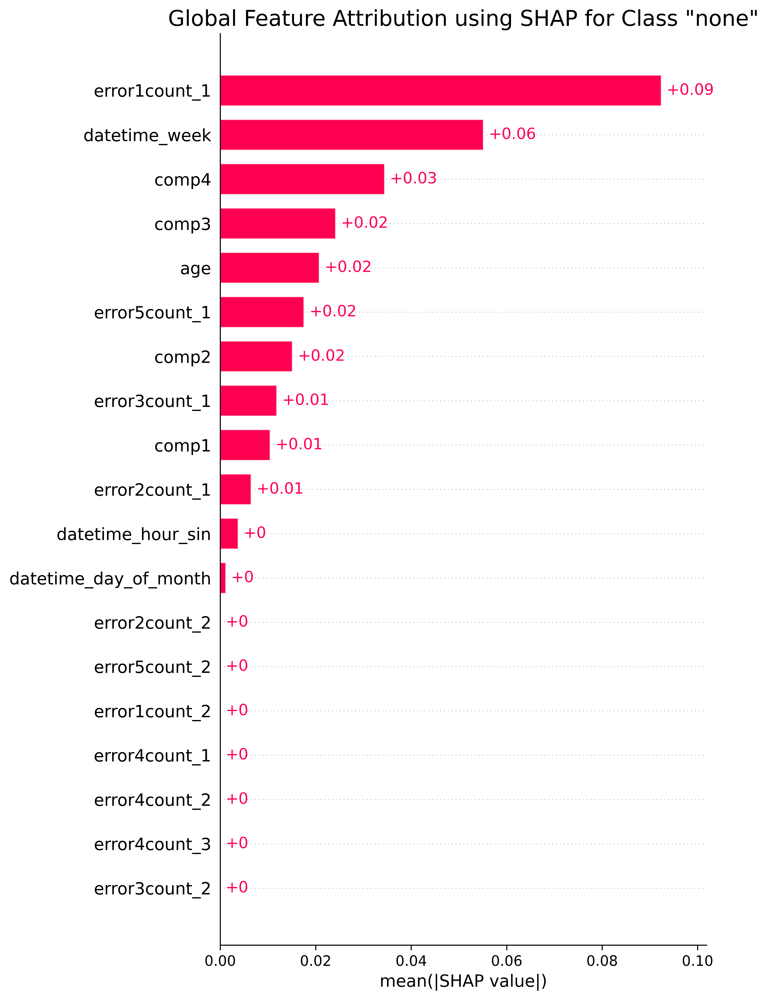

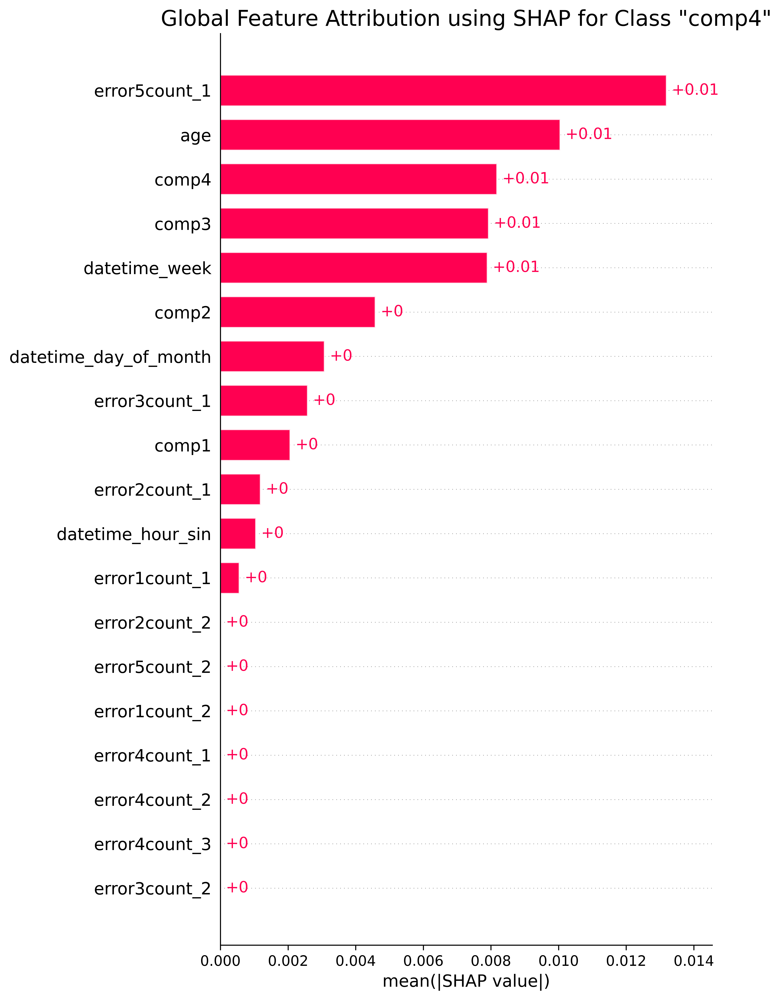

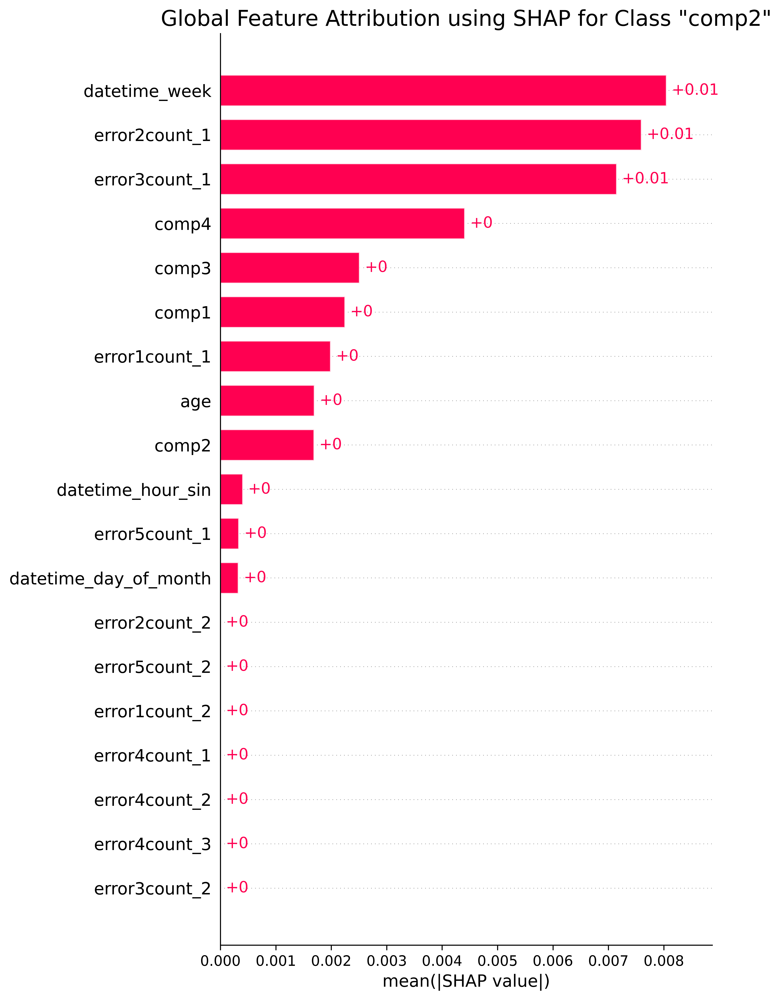

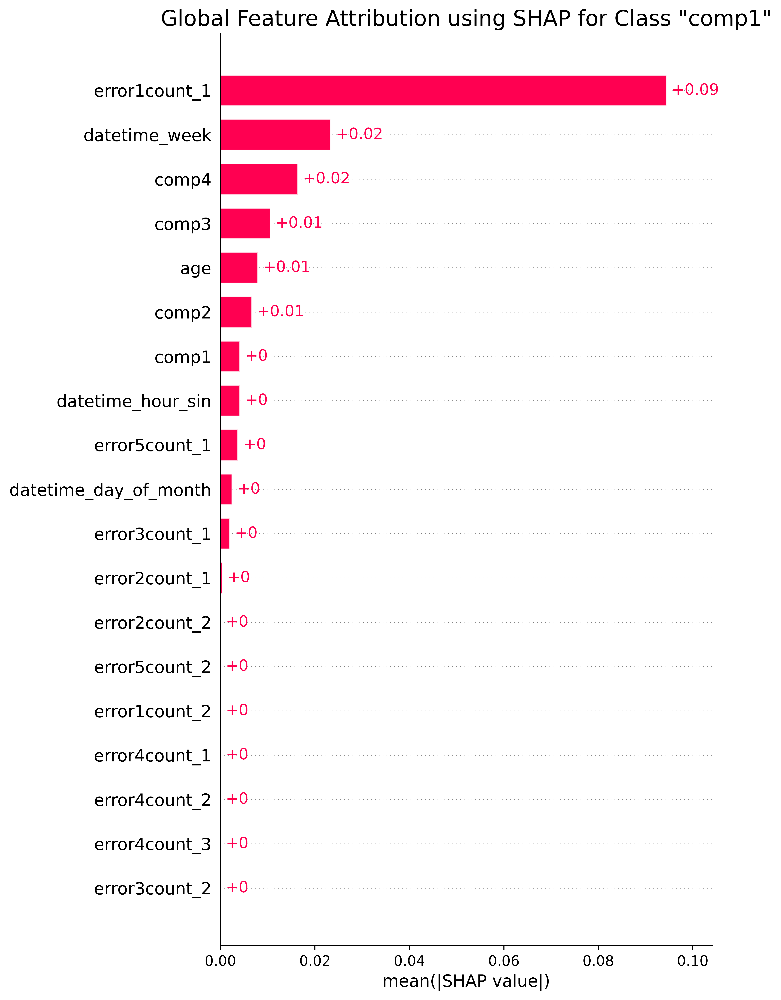

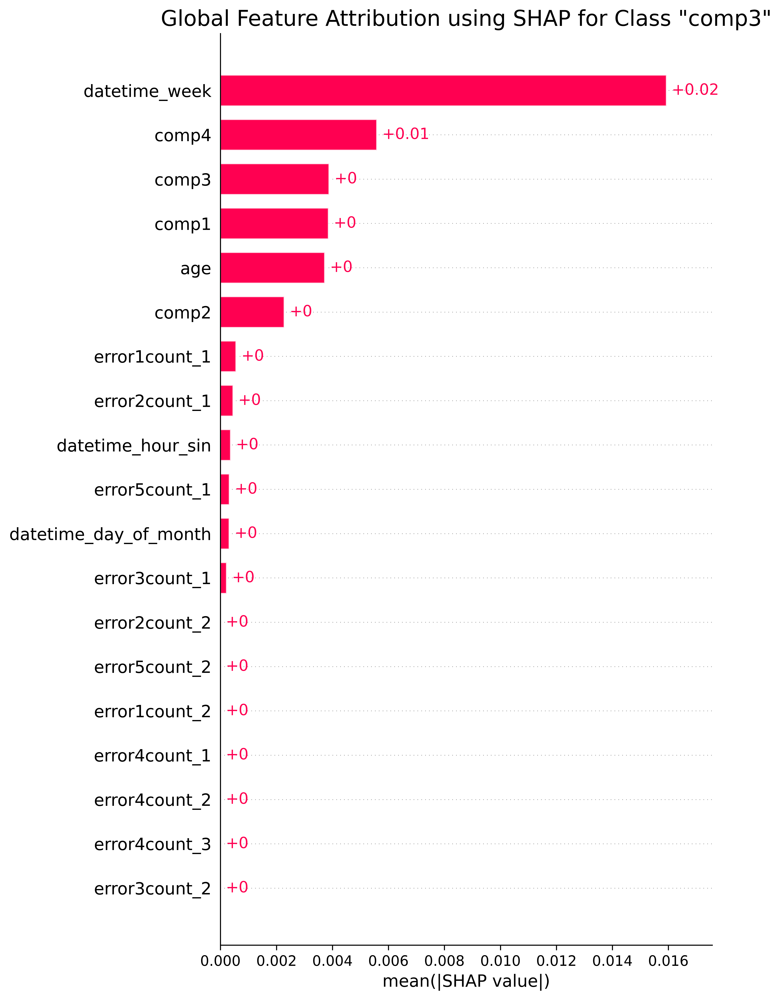

In [100]:
# Recall numerical labels and class labels mappings:
# - 'comp1'= class 0
# - 'comp2'= class 1
# - 'comp3'= class 2
# - 'comp4'= class 3
# - 'none'= class 4

# Define the class indices
class_indices = [4, 3, 1, 0, 2]

# Iterate over each class index
for class_index in class_indices:
    
    # Get the class label from the mapping
    class_label = unique_class_labels[class_index]
    
    # Global explainability: Summary Plot
    # plt.title(f'Global Feature Attribution using SHAP for Class "{class_label}" (Class index {class_index})')
    plt.title(f'Global Feature Attribution using SHAP for Class "{class_label}"')
    
    shap.plots.bar(shap_values_multiple[:,:,class_index], show=True, max_display=50)

### Counterfactual Explanations (CFEs)

Preparing the DiCE data object

In [101]:
# Preparing the DiCE data object
data_object = dice_ml.Data(dataframe = xai_df,
                           continuous_features = numeric_columns,
                        #    continuous_features = list(xai_df.select_dtypes(exclude='category').columns),
                           outcome_name = target_variable)
backend = 'TF'+tf.__version__[0]
# backend = 'sklearn'

model_object = dice_ml.Model(model = cnn_lstm_modelNN, backend=backend, model_type='classifier') # Creating TensorFlow model object

Creating DiCE explanation object

In [102]:
# Creating DiCE explanation object
explainer = dice_ml.Dice(data_object, model_object, method = 'random')

### Counterfactuals are focusing to each none failure into a comp failure. Meaning we are trying to find out what conditions lead to a specific type of failure

#### Query instance of class 4 "none", and the counterfactual generated for class 2 "comp3", for desired class 0

In [81]:
# Let's select a query instance 

# Recall numerical labels and class labels mappings:
# - 'comp1'= class 0
# - 'comp2'= class 1
# - 'comp3'= class 2
# - 'comp4'= class 3
# - 'none'= class 4

# [(4, 0), (3, 67), (1, 73), (0, 85), (2, 2089)]

# (4, 0) -> (class label, first instance index), (class 4, index 0)

# Therefore, the query instance below is for a machine that has not failed yet (class 4 "none") and has the following feature values:

test_query = xai_df[0:1].drop(target_variable, axis=1)

cfe = explainer.generate_counterfactuals(test_query, 
                                        total_CFs=5, 
                                        desired_range=None,
                                        desired_class=0,
                                        # features_to_vary = numeric_columns,
                                        features_to_vary= "all",
                                        random_seed = rng,
                                        proximity_weight=1.5,
                                        diversity_weight=1.0,
                                        stopping_threshold=0.5,
                                        verbose=True)

100%|██████████| 1/1 [00:06<00:00,  6.28s/it]

Diverse Counterfactuals found! total time taken: 00 min 05 sec


In [90]:
# Estimate Local Feature Importance
local_importance = explainer.local_feature_importance(test_query, desired_class=2)
print(local_importance.local_importance)

100%|██████████| 1/1 [00:06<00:00,  6.95s/it]

[{'error3count_1': 1.0, 'error3count_2': 1.0, 'error5count_1': 1.0, 'error5count_2': 1.0, 'error4count_1': 1.0, 'error4count_2': 1.0, 'error4count_3': 1.0, 'error2count_1': 1.0, 'error2count_2': 1.0, 'error1count_1': 0.9, 'error1count_2': 0.9, 'comp1': 0.2, 'datetime_week': 0.1, 'age': 0.1, 'datetime_day_of_month': 0.0, 'datetime_hour_sin': 0.0, 'comp2': 0.0, 'comp4': 0.0, 'comp3': 0.0}]


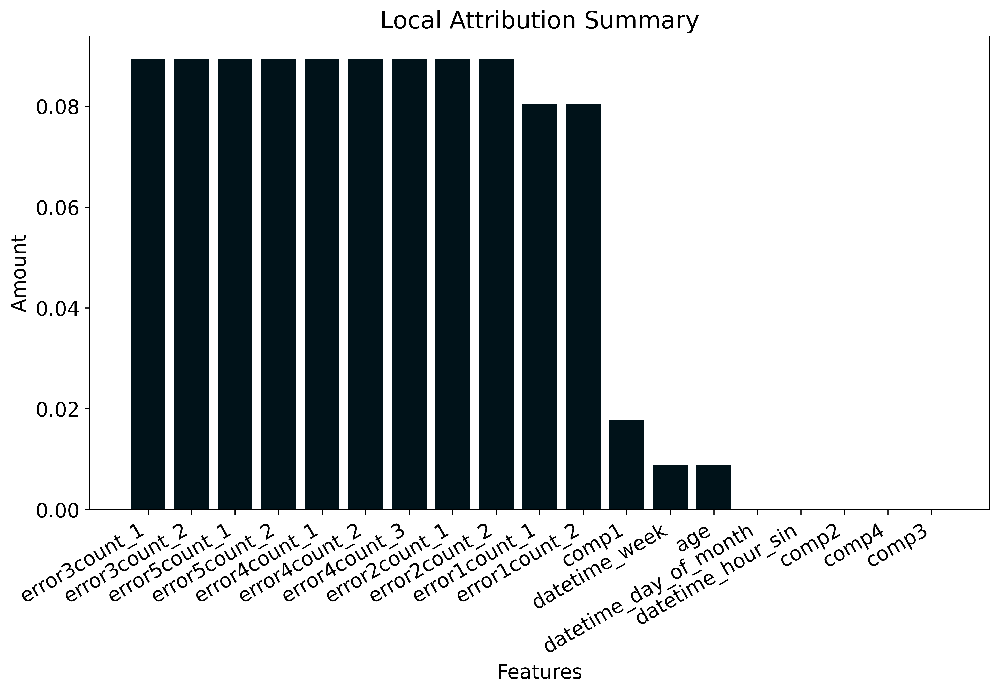

In [91]:
# # Create a figure and axis object
fig, ax = plt.subplots(figsize=(10, 7))
plt.bar(range(len(local_importance.local_importance[0])), 
        list(local_importance.local_importance[0].values())/(np.sum(list(local_importance.local_importance[0].values()))), 
        tick_label=list(local_importance.local_importance[0].keys()))
plt.ylabel('Amount')
plt.xlabel('Features')
ax.set_title("Local Attribution Summary")
# make x-axis ticks legible
fig = plt.gcf()
fig.autofmt_xdate()  # auto format data
plt.show()

#### Query instance of class 4 "none", and the counterfactual generated for class 2 "comp3", for desired class 0 until 3 that is "comp1" until "comp4"

In [103]:
# Desired classes for which you want to generate counterfactuals
desired_classes = [3, 1, 0, 2]

test_query = xai_df[0:1].drop(target_variable, axis=1)

for desired_class in desired_classes:
    # class_label = class_label_mapping[desired_class]  # Get the corresponding string label
    class_label = unique_class_labels[desired_class] # Get the corresponding string label

    # Generate counterfactuals
    cfe = explainer.generate_counterfactuals(test_query, 
                                            total_CFs=5, 
                                            desired_range=None,
                                            desired_class=desired_class,
                                            features_to_vary="all",
                                            random_seed=rng,
                                            proximity_weight=1.5,
                                            diversity_weight=1.0,
                                            stopping_threshold=0.5,
                                            verbose=True)

    cfe.visualize_as_dataframe(show_only_changes=True)

    # Extract the counterfactual instance
    counterfactual_instance = cfe.cf_examples_list[0].final_cfs_df

    # Get the original input query
    original_query = test_query.values.flatten()

    # Iterate through the counterfactuals and compare with the original query
    for i, cf in enumerate(counterfactual_instance.values):
        print(f'Counterfactual {i + 1} for Class "{class_label}" ( and Desired Class index {desired_class}):')
        for feature_idx, (original_value, cf_value) in enumerate(zip(original_query, cf)):
            if original_value != cf_value:
                feature_name = test_query.columns[feature_idx]
                print(f"The feature {feature_name} has to change from {original_value} to {cf_value}")
        print("\n")
    
    # Iterate through the counterfactuals and compare with the original query
    for i, cf in enumerate(counterfactual_instance.values):
        print(f'Counterfactual {i + 1} for Class "{class_label}" ( and Desired Class {desired_class}):')
        for feature_idx, (original_value, cf_value) in enumerate(zip(original_query, cf)):
            feature_name = test_query.columns[feature_idx]

            # Handle categorical variables
            if isinstance(original_value, str) or isinstance(cf_value, str):
                if original_value != cf_value:
                    print(f"The feature {feature_name} has to change from '{original_value}' to '{cf_value}'")
            else:
                # Calculate the change for numerical variables
                change = cf_value - original_value
                if change != 0:
                    percentage_change = (change / abs(original_value)) * 100
                    print(f"The feature {feature_name} has to change by {change} ({percentage_change:.2f}%) to {cf_value}")
        print("\n")

    # # Estimate Local Feature Importance
    # local_importance = explainer.local_feature_importance(test_query, desired_class=desired_class)
    # print(f'Local Feature Importance for class "{class_label}" (Desired Class {desired_class}):')
    # print(local_importance.local_importance)

    # fig, ax = plt.subplots(figsize=(10, 7))
    # plt.bar(range(len(local_importance.local_importance[0])), 
    #         list(local_importance.local_importance[0].values())/(np.sum(list(local_importance.local_importance[0].values()))), 
    #         tick_label=list(local_importance.local_importance[0].keys()))
    # plt.ylabel('Amount')
    # plt.xlabel('Features')
    # ax.set_title(f'Local Attribution Summary for class "{class_label}" (Desired Class {desired_class})')
    # fig.autofmt_xdate()  # Auto format data
    # plt.show()

100%|██████████| 1/1 [00:03<00:00,  3.96s/it]

Diverse Counterfactuals found! total time taken: 00 min 03 sec
Query instance (original outcome : 4)


,datetime_day_of_month,datetime_hour_sin,datetime_week,comp1,age,comp2,comp4,comp3,error3count_1,error3count_2,error5count_1,error5count_2,error1count_1,error1count_2,error4count_1,error4count_2,error4count_3,error2count_1,error2count_2,failure
0,-1.62212,0.656921,-1.730015,2.101052,-0.742932,1.278897,-0.369327,1.718442,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4



Diverse Counterfactual set (new outcome: 3)


,datetime_day_of_month,datetime_hour_sin,datetime_week,comp1,age,comp2,comp4,comp3,error3count_1,error3count_2,error5count_1,error5count_2,error1count_1,error1count_2,error4count_1,error4count_2,error4count_3,error2count_1,error2count_2,failure
0,-,-,-,4.31171837,-,-,-,-,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
1,-,-,-,-,-1.13645388,-,-,-,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
2,-,-,-,-,-0.42985765,-,-,-,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
3,-,-,-,-,-,-,-,1.0456664,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
4,-,-,-,-,-,-,-,-,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,3


Counterfactual 1 for Class "comp4" ( and Desired Class index 3):
The feature comp1 has to change from 2.1010522842407227 to 4.31171837
The feature error5count_1 has to change from 0.0 to 1.0


Counterfactual 2 for Class "comp4" ( and Desired Class index 3):
The feature age has to change from -0.7429318428039551 to -1.13645388
The feature error5count_1 has to change from 0.0 to 1.0


Counterfactual 3 for Class "comp4" ( and Desired Class index 3):
The feature age has to change from -0.7429318428039551 to -0.42985765
The feature error5count_1 has to change from 0.0 to 1.0


Counterfactual 4 for Class "comp4" ( and Desired Class index 3):
The feature comp3 has to change from 1.7184416055679321 to 1.0456664
The feature error5count_1 has to change from 0.0 to 1.0


Counterfactual 5 for Class "comp4" ( and Desired Class index 3):
The feature error5count_1 has to change from 0.0 to 1.0
The feature error4count_3 has to change from 0.0 to 1.0


Counterfactual 1 for Class "comp4" ( and Desired C

100%|██████████| 1/1 [00:03<00:00,  3.81s/it]

Diverse Counterfactuals found! total time taken: 00 min 03 sec
Query instance (original outcome : 4)


,datetime_day_of_month,datetime_hour_sin,datetime_week,comp1,age,comp2,comp4,comp3,error3count_1,error3count_2,error5count_1,error5count_2,error1count_1,error1count_2,error4count_1,error4count_2,error4count_3,error2count_1,error2count_2,failure
0,-1.62212,0.656921,-1.730015,2.101052,-0.742932,1.278897,-0.369327,1.718442,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4



Diverse Counterfactual set (new outcome: 1)


,datetime_day_of_month,datetime_hour_sin,datetime_week,comp1,age,comp2,comp4,comp3,error3count_1,error3count_2,error5count_1,error5count_2,error1count_1,error1count_2,error4count_1,error4count_2,error4count_3,error2count_1,error2count_2,failure
0,-,-0.8527718322,-,-,-,-,-,-,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1
1,-,-,-,-,-,-,-,-,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1
2,-,-,-,-,-,-,-,-,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1
3,-,-,-,-,-,-,2.04636202,-,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1
4,-,-,-,0.16502794,-,-,-,-,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1


Counterfactual 1 for Class "comp2" ( and Desired Class index 1):
The feature datetime_hour_sin has to change from 0.6569207906723022 to -0.8527718322
The feature error2count_1 has to change from 0.0 to 1.0


Counterfactual 2 for Class "comp2" ( and Desired Class index 1):
The feature error3count_1 has to change from 0.0 to 1.0
The feature error4count_3 has to change from 0.0 to 1.0


Counterfactual 3 for Class "comp2" ( and Desired Class index 1):
The feature error4count_2 has to change from 0.0 to 1.0
The feature error2count_1 has to change from 0.0 to 1.0


Counterfactual 4 for Class "comp2" ( and Desired Class index 1):
The feature comp4 has to change from -0.369327187538147 to 2.04636202
The feature error2count_1 has to change from 0.0 to 1.0


Counterfactual 5 for Class "comp2" ( and Desired Class index 1):
The feature comp1 has to change from 2.1010522842407227 to 0.16502794
The feature error2count_1 has to change from 0.0 to 1.0


Counterfactual 1 for Class "comp2" ( and Desired

100%|██████████| 1/1 [00:03<00:00,  3.81s/it]

Diverse Counterfactuals found! total time taken: 00 min 03 sec
Query instance (original outcome : 4)


,datetime_day_of_month,datetime_hour_sin,datetime_week,comp1,age,comp2,comp4,comp3,error3count_1,error3count_2,error5count_1,error5count_2,error1count_1,error1count_2,error4count_1,error4count_2,error4count_3,error2count_1,error2count_2,failure
0,-1.62212,0.656921,-1.730015,2.101052,-0.742932,1.278897,-0.369327,1.718442,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4



Diverse Counterfactual set (new outcome: 0)


,datetime_day_of_month,datetime_hour_sin,datetime_week,comp1,age,comp2,comp4,comp3,error3count_1,error3count_2,error5count_1,error5count_2,error1count_1,error1count_2,error4count_1,error4count_2,error4count_3,error2count_1,error2count_2,failure
0,-,-,-,-,-,-,1.82338613,-,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0
1,-,-,-,4.61362886,-,-,-,-,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,-,-,-1.3437247,-,-,-,-,-,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,-,-,-,-,-,-0.83951104,-,-,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,-,-,-,-,-,-,-,-,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0


Counterfactual 1 for Class "comp1" ( and Desired Class index 0):
The feature comp4 has to change from -0.369327187538147 to 1.82338613
The feature error4count_2 has to change from 0.0 to 1.0


Counterfactual 2 for Class "comp1" ( and Desired Class index 0):
The feature comp1 has to change from 2.1010522842407227 to 4.61362886
The feature error5count_2 has to change from 0.0 to 1.0


Counterfactual 3 for Class "comp1" ( and Desired Class index 0):
The feature datetime_week has to change from -1.7300148010253906 to -1.3437247
The feature error5count_2 has to change from 0.0 to 1.0


Counterfactual 4 for Class "comp1" ( and Desired Class index 0):
The feature comp2 has to change from 1.2788968086242676 to -0.83951104
The feature error1count_1 has to change from 0.0 to 1.0


Counterfactual 5 for Class "comp1" ( and Desired Class index 0):
The feature error1count_2 has to change from 0.0 to 1.0
The feature error2count_1 has to change from 0.0 to 1.0


Counterfactual 1 for Class "comp1" ( an

100%|██████████| 1/1 [00:03<00:00,  3.80s/it]

Diverse Counterfactuals found! total time taken: 00 min 03 sec
Query instance (original outcome : 4)


,datetime_day_of_month,datetime_hour_sin,datetime_week,comp1,age,comp2,comp4,comp3,error3count_1,error3count_2,error5count_1,error5count_2,error1count_1,error1count_2,error4count_1,error4count_2,error4count_3,error2count_1,error2count_2,failure
0,-1.62212,0.656921,-1.730015,2.101052,-0.742932,1.278897,-0.369327,1.718442,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4



Diverse Counterfactual set (new outcome: 2)


,datetime_day_of_month,datetime_hour_sin,datetime_week,comp1,age,comp2,comp4,comp3,error3count_1,error3count_2,error5count_1,error5count_2,error1count_1,error1count_2,error4count_1,error4count_2,error4count_3,error2count_1,error2count_2,failure
0,-,-,-,-,-,-,-,-,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,2
1,-,-,-,-,-,-,-,-,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2
2,-,-0.7872544358,-,-,-,-,-,-,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2
3,-,-,-,-,-,-,1.2988833,-,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2
4,-,-,-,-,-,-,-,-,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2


Counterfactual 1 for Class "comp3" ( and Desired Class index 2):
The feature error1count_2 has to change from 0.0 to 1.0
The feature error4count_1 has to change from 0.0 to 1.0


Counterfactual 2 for Class "comp3" ( and Desired Class index 2):
The feature error3count_1 has to change from 0.0 to 1.0
The feature error4count_1 has to change from 0.0 to 1.0


Counterfactual 3 for Class "comp3" ( and Desired Class index 2):
The feature datetime_hour_sin has to change from 0.6569207906723022 to -0.7872544358
The feature error4count_1 has to change from 0.0 to 1.0


Counterfactual 4 for Class "comp3" ( and Desired Class index 2):
The feature comp4 has to change from -0.369327187538147 to 1.2988833
The feature error4count_1 has to change from 0.0 to 1.0


Counterfactual 5 for Class "comp3" ( and Desired Class index 2):
The feature error4count_1 has to change from 0.0 to 1.0
The feature error2count_1 has to change from 0.0 to 1.0


Counterfactual 1 for Class "comp3" ( and Desired Class 2):
The 

In [92]:
# # Looking for Global Importance (sort of, selecting a range of samples instead of just one)
# global_importance = explainer.global_feature_importance(xai_df[0:10].drop(target_variable, axis=1), total_CFs=5, posthoc_sparsity_param=None, desired_class=4)
# # global_importance = explainer.global_feature_importance(xai_df[0:sample_size].drop(target_variable, axis=1), total_CFs=5, posthoc_sparsity_param=None, desired_class=4)
# print(global_importance.summary_importance)

100%|██████████| 10/10 [00:20<00:00,  2.09s/it]

{'error3count_2': 0.99, 'error4count_1': 0.99, 'error4count_2': 0.99, 'error4count_3': 0.99, 'error3count_1': 0.98, 'error1count_1': 0.98, 'error5count_1': 0.97, 'error5count_2': 0.97, 'error1count_2': 0.97, 'error2count_2': 0.97, 'error2count_1': 0.95, 'datetime_hour_sin': 0.15, 'age': 0.1, 'datetime_day_of_month': 0.09, 'comp4': 0.06, 'comp3': 0.05, 'comp1': 0.04, 'datetime_week': 0.03, 'comp2': 0.03}


In [93]:
# # Save trained model to disk
# filename = '../../code/machines/models/DL_cfe_explainer_model_2023.sav'
# joblib.dump(global_importance, open(filename, 'wb'), compress=3)

#### Load trained CFE model

In [94]:
# # load the model from disk
# filename = '../../code/machines/models/DL_cfe_explainer_model_2023.sav'
# global_importance = joblib.load(open(filename, 'rb'))

In [95]:
# print(global_importance.summary_importance)

{'error3count_2': 0.99, 'error4count_1': 0.99, 'error4count_2': 0.99, 'error4count_3': 0.99, 'error3count_1': 0.98, 'error1count_1': 0.98, 'error5count_1': 0.97, 'error5count_2': 0.97, 'error1count_2': 0.97, 'error2count_2': 0.97, 'error2count_1': 0.95, 'datetime_hour_sin': 0.15, 'age': 0.1, 'datetime_day_of_month': 0.09, 'comp4': 0.06, 'comp3': 0.05, 'comp1': 0.04, 'datetime_week': 0.03, 'comp2': 0.03}


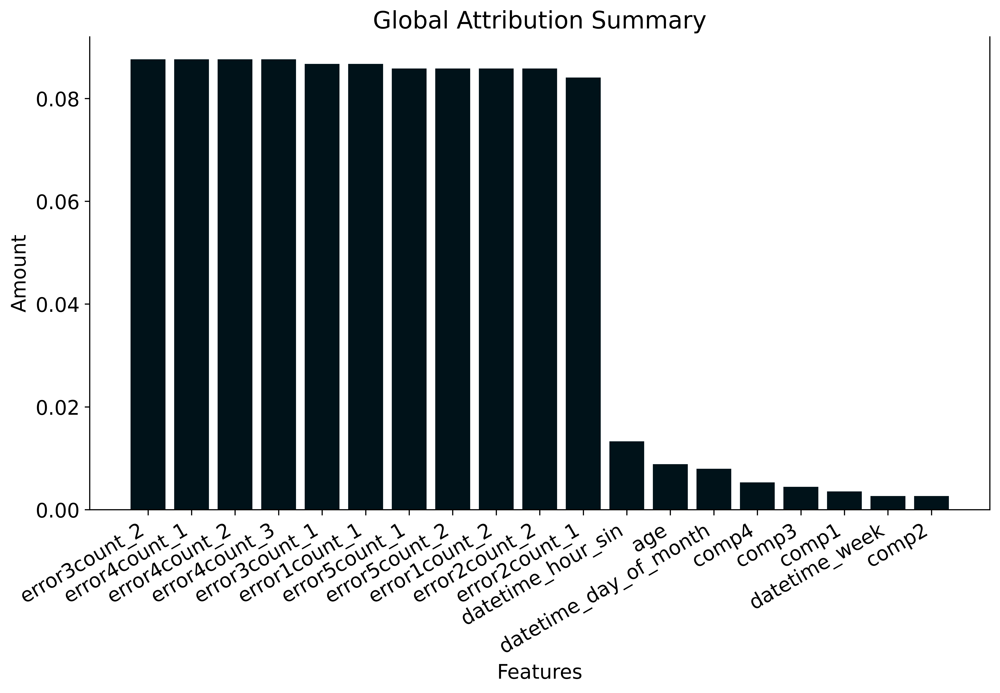

In [96]:
# # Create a figure and axis object
# fig, ax = plt.subplots(figsize=(10, 7))
# plt.bar(range(len(global_importance.summary_importance)), 
#         list(global_importance.summary_importance.values())/(np.sum(list(global_importance.summary_importance.values()))), 
#         tick_label=list(global_importance.summary_importance.keys()))
# plt.ylabel('Amount')
# plt.xlabel('Features')
# ax.set_title("Global Attribution Summary")
# # make x-axis ticks legible
# fig = plt.gcf()
# fig.autofmt_xdate()  # auto format data
# plt.show()